<center>
<center>
<h4>MECH564 Fundamentals of Robot Mechanics and Control</h4>
<font><h2>Lab4: Control of Robotic Manipulators </h2></font>
<h4>Colorado State University</h4>
</center>

In this lab, you will design and implement feedback controllers for robotic manipulators of increasing complexity — from a single-joint arm to a 6-DOF industrial robot. The lab builds progressively: controllers derived analytically in Tasks 1–2 are extended to multi-link robots in Tasks 3–4 using MuJoCo as the physics simulator. The final Problems section asks you to apply these ideas independently to a new 3R spatial robot.

## Learning Objectives

By the end of this lab, you should be able to:

1. **Derive and simulate single-joint controllers** — implement speed (PI) and position (PD) feedback control for a 1R arm using an analytical dynamics model, and analyze closed-loop stability.

2. **Apply computed torque control (CTC)** — implement the feedforward + feedback computed torque law that cancels nonlinear dynamics and produces decoupled linear error dynamics for exact trajectory tracking.

3. **Use MuJoCo for robot simulation** — interface with MuJoCo's dynamics API to compute mass matrices, bias forces, and Jacobians without deriving them analytically.

4. **Extend CTC to multi-link robots** — generalize computed torque control from a 1R arm to a 2R planar robot and a 6-DOF UR5, in both joint space and operational (Cartesian) space.

5. **Compare joint-space and operational-space control** — understand the relationship between joint-space CTC, operational-space CTC, and IK + joint-space CTC.

6. **Design controllers for a new robot** — implement PD and computed torque controllers for a 3R spatial robot, tune gains, and evaluate performance on reaching and trajectory tracking tasks.

In [1]:
!pip install mujoco mediapy numpy scipy
import os
import mujoco
import mediapy as media
import numpy as np
from IPython.display import clear_output
clear_output()

## Task 1: Control of a Single Joint Robotic Arm Using Analytical Models

### Dynamics Model

Consider a single motor attached to a single rigid link. Let $\tau$ be the motor torque and $\theta$ the joint angle. Rotational friction is modeled as a viscous damping force (Eq. 11.20):

$$\tau_{\text{fric}} = b\dot{\theta}$$

Adding the friction torque to the basic equation of motion gives the full model (Eq. 11.21):

$$\tau = M\ddot{\theta} + mgr\cos\theta + b\dot{\theta}$$

which can be written compactly as (Eq. 11.22):

$$\tau = M\ddot{\theta} + h(\theta, \dot{\theta})$$

where $h(\theta, \dot{\theta}) = mgr\cos\theta + b\dot{\theta}$ contains all state-dependent terms. Rearranging for simulation:

$$\ddot{\theta} = \frac{\tau - mgr\cos\theta - b\dot{\theta}}{M}$$

**Variable definitions:**
- $M$:  scalar rotational inertia [kg·m²]
- $m$:  link mass [kg]
- $r$:  distance from joint axis to center of mass [m]
- $b$:  viscous friction coefficient [N·m·s/rad]
- $g$:  gravitational acceleration [m/s²]

**Two models used throughout this task** (textbook parameters: $M=0.5$ kg·m², $m=1$ kg, $r=0.1$ m, $b=0.1$ N·m·s/rad):

| Model | Gravity | Equation of Motion |
|---|---|---|
| **Horizontal** | $g = 0$ | $\tau = M\ddot{\theta} + b\dot{\theta}$ |
| **Vertical** | $g = 9.81\ \text{m/s}^2$ | $\tau = M\ddot{\theta} + mgr\cos\theta + b\dot{\theta}$ |

The horizontal model reduces to a first-order system in $\dot{\theta}$, useful for speed control. The vertical model adds a nonlinear gravity load that controllers must compensate.

Max gravity torque: m·g·r = 0.981 N·m  (at θ=0)


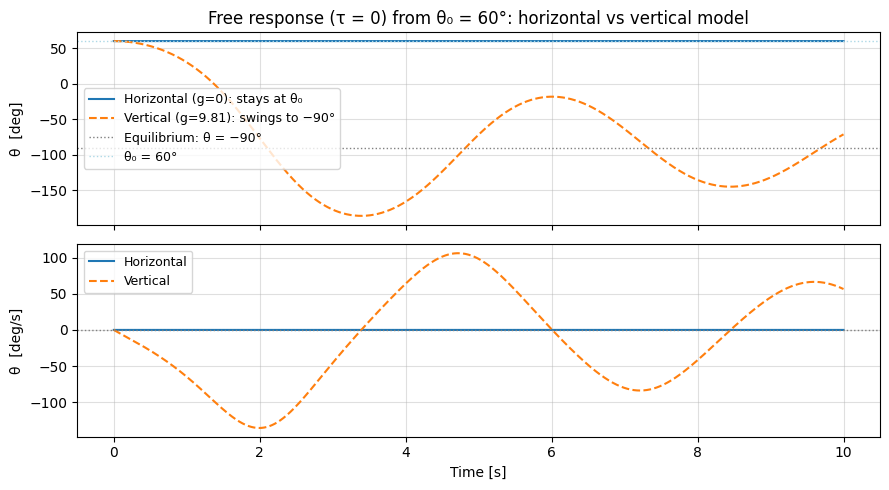

In [4]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

# -------------------------------------------------------
# Single-Joint Dynamics Parameters (textbook values)
# -------------------------------------------------------
# Full model (Eq. 11.21):  τ = M*θ̈ + m*g*r*cos(θ) + b*θ̇
#   vertical   (with gravity):  τ = M*θ̈ + m*g*r*cos(θ) + b*θ̇
#   horizontal (g = 0):         τ = M*θ̈ + b*θ̇

M_link = 0.5   # rotational inertia [kg·m²]
m_link = 1.0   # link mass [kg]
r_link = 0.1   # distance from joint axis to CoM [m]
b_link = 0.1   # viscous friction coefficient [N·m·s/rad]
g_acc  = 9.81  # gravitational acceleration [m/s²]


class SingleJointModel:
    """
    Dynamics model for a single revolute joint with viscous friction.

    Full equation of motion (Eq. 11.21):
        τ = M*θ̈ + m*g*r*cos(θ) + b*θ̇

    Rearranged for simulation:
        θ̈ = (τ - m*g*r*cos(θ) - b*θ̇) / M

    Setting g=0 gives the horizontal (gravity-free) model:
        θ̈ = (τ - b*θ̇) / M

    Parameters
    ----------
    M : float – rotational inertia [kg·m²]
    m : float – link mass [kg]
    r : float – distance from joint axis to CoM [m]
    b : float – viscous friction coefficient [N·m·s/rad]
    g : float – gravitational acceleration (0 for horizontal)
    """

    def __init__(self, M, m, r, b, g=0.0):
        self.M = M
        self.m = m
        self.r = r
        self.b = b
        self.g = g

    def h(self, theta, theta_dot):
        """State-dependent torque h(θ, θ̇) = m*g*r*cos(θ) + b*θ̇  [N·m]"""
        return self.m * self.g * self.r * np.cos(theta) + self.b * theta_dot

    def _ode(self, t, state, tau_func):
        """
        ODE right-hand side.
        state = [θ, θ̇]  →  returns [θ̇, θ̈]
        """
        theta, theta_dot = state
        tau = tau_func(t, state)
        theta_ddot = (tau - self.h(theta, theta_dot)) / self.M
        return [theta_dot, theta_ddot]

    def simulate(self, tau_func, t_span, state0, dt=0.001):
        """
        Simulate the joint dynamics with RK45.

        Parameters
        ----------
        tau_func : callable(t, state) → float   applied torque [N·m]
        t_span   : (t0, tf)                     simulation time window [s]
        state0   : [θ0, θ̇0]                    initial conditions
        dt       : float                         output time step [s]

        Returns
        -------
        t      : (N,) array – time [s]
        theta  : (N,) array – joint angle [rad]
        dtheta : (N,) array – joint velocity [rad/s]
        """
        t_eval = np.arange(t_span[0], t_span[1], dt)
        sol = solve_ivp(
            self._ode,
            t_span,
            state0,
            args=(tau_func,),
            t_eval=t_eval,
            method="RK45",
            rtol=1e-6,
            atol=1e-8,
        )
        return sol.t, sol.y[0], sol.y[1]


# -------------------------------------------------------
# Instantiate both models
# -------------------------------------------------------
model_horizontal = SingleJointModel(M=M_link, m=m_link, r=r_link, b=b_link, g=0.0)
model_vertical   = SingleJointModel(M=M_link, m=m_link, r=r_link, b=b_link, g=g_acc)

max_gravity = model_vertical.m * model_vertical.g * model_vertical.r
print(f"Max gravity torque: m·g·r = {max_gravity:.3f} N·m  (at θ=0)")

# -------------------------------------------------------
# Sanity check: free response from θ₀ = 60° (τ = 0)
#
# Horizontal: no restoring force → friction damps θ̇ to zero, θ stays near θ₀
# Vertical:   gravity acts as restoring force → pendulum oscillation settling at θ = -π/2
# -------------------------------------------------------
tau_zero = lambda t, state: 0.0
theta0   = np.pi / 3          # initial angle: 60°
state0   = [theta0, 0.0]      # start from rest
t_span   = (0.0, 10.0)

t_h, th_h, dth_h = model_horizontal.simulate(tau_zero, t_span, state0)
t_v, th_v, dth_v = model_vertical.simulate(tau_zero, t_span, state0)

fig, axes = plt.subplots(2, 1, figsize=(9, 5), sharex=True)

axes[0].plot(t_h, np.degrees(th_h), label="Horizontal (g=0): stays at θ₀")
axes[0].plot(t_v, np.degrees(th_v), label="Vertical (g=9.81): swings to −90°", linestyle="--")
axes[0].axhline(-90, color="gray", linestyle=":", lw=1, label="Equilibrium: θ = −90°")
axes[0].axhline(np.degrees(theta0), color="lightblue", linestyle=":", lw=1, label=f"θ₀ = {np.degrees(theta0):.0f}°")
axes[0].set_ylabel("θ  [deg]")
axes[0].legend(fontsize=9)
axes[0].set_title("Free response (τ = 0) from θ₀ = 60°: horizontal vs vertical model")
axes[0].grid(True, alpha=0.4)

axes[1].plot(t_h, np.degrees(dth_h), label="Horizontal")
axes[1].plot(t_v, np.degrees(dth_v), label="Vertical", linestyle="--")
axes[1].axhline(0, color="gray", linestyle=":", lw=1)
axes[1].set_ylabel("θ̇  [deg/s]")
axes[1].set_xlabel("Time [s]")
axes[1].legend(fontsize=9)
axes[1].grid(True, alpha=0.4)

plt.tight_layout()
plt.show()

### Speed Control: First-Order System

Using the horizontal model ($g = 0$), the equation of motion in terms of angular speed $\omega = \dot{\theta}$ is:

$$\tau = M\dot{\omega} + b\omega$$

This is a **first-order linear ODE** in $\omega$. For a constant (step) torque input $\tau$, the analytical solution is:

$$\omega(t) = \underbrace{\frac{\tau}{b}}_{\omega_{ss}} \left(1 - e^{-t/\tau_c}\right), \qquad \tau_c = \frac{M}{b}$$

where:
- $\omega_{ss} = \tau / b$: steady-state speed (set by friction, independent of inertia)
- $\tau_c = M / b$: **time constant**: time for $\omega$ to reach $63.2\%$ of $\omega_{ss}$

A larger inertia $M$ slows the response; a larger friction $b$ reduces both the time constant and the steady-state speed.

Time constant  τ_c  = M / b = 0.5 / 0.1 = 5.00 s
Steady-state speed  ω_ss = τ / b = 1.0 / 0.1 = 10.00 rad/s
At t = τ_c:  ω = 6.321 rad/s  (63.2% of ω_ss)


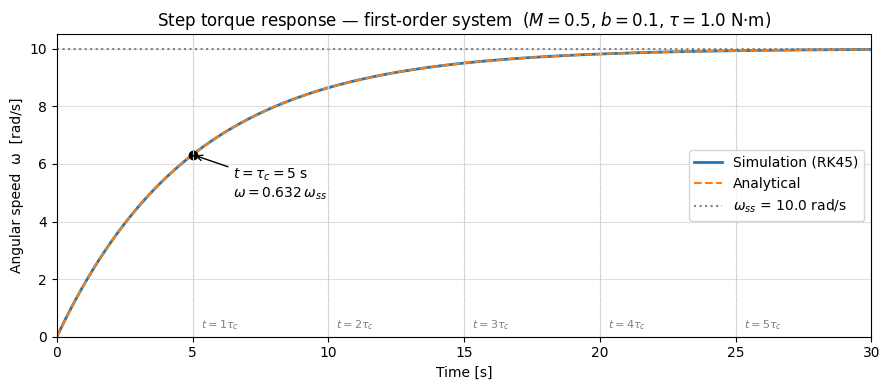

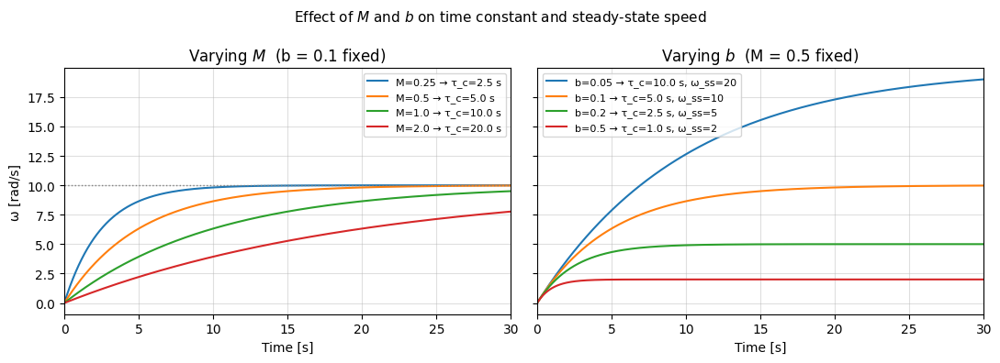

In [5]:
# -------------------------------------------------------
# Speed Control: First-Order System (horizontal model)
# Input: constant torque τ   Output: angular speed ω = θ̇
# -------------------------------------------------------

tau_step = 1.0   # step torque input [N·m]
t_span   = (0.0, 30.0)
state0   = [0.0, 0.0]   # [θ0, ω0] — start from rest

# Simulate with the horizontal model
tau_func = lambda t, state: tau_step
t_sim, _, omega_sim = model_horizontal.simulate(tau_func, t_span, state0)

# -------------------------------------------------------
# Analytical first-order step response
# ω(t) = ω_ss * (1 - exp(-t / τ_c))
# -------------------------------------------------------
tau_c   = model_horizontal.M / model_horizontal.b   # time constant [s]
omega_ss = tau_step / model_horizontal.b             # steady-state speed [rad/s]
omega_analytical = omega_ss * (1 - np.exp(-t_sim / tau_c))

print(f"Time constant  τ_c  = M / b = {model_horizontal.M} / {model_horizontal.b} = {tau_c:.2f} s")
print(f"Steady-state speed  ω_ss = τ / b = {tau_step} / {model_horizontal.b} = {omega_ss:.2f} rad/s")
print(f"At t = τ_c:  ω = {omega_ss * (1 - np.exp(-1)):.3f} rad/s  ({(1-np.exp(-1))*100:.1f}% of ω_ss)")

# -------------------------------------------------------
# Plot: illustrate time constant concept
# -------------------------------------------------------
fig, ax = plt.subplots(figsize=(9, 4))

ax.plot(t_sim, omega_sim,         color="tab:blue",   lw=2,   label="Simulation (RK45)")
ax.plot(t_sim, omega_analytical,  color="tab:orange", lw=1.5, linestyle="--", label="Analytical")
ax.axhline(omega_ss, color="gray", linestyle=":",  lw=1.5, label=f"$\\omega_{{ss}}$ = {omega_ss:.1f} rad/s")

# Mark the time constant point
omega_tc = omega_ss * (1 - np.exp(-1))
ax.annotate(
    f"$t = \\tau_c = {tau_c:.0f}$ s\n$\\omega = 0.632\\,\\omega_{{ss}}$",
    xy=(tau_c, omega_tc),
    xytext=(tau_c + 1.5, omega_tc - 1.5),
    arrowprops=dict(arrowstyle="->", color="black"),
    fontsize=10,
)
ax.plot(tau_c, omega_tc, "ko", markersize=6)

# Mark multiples of τ_c with vertical dashed lines
for k in range(1, 6):
    ax.axvline(k * tau_c, color="lightgray", linestyle="--", lw=0.8)
    ax.text(k * tau_c + 0.3, 0.3, f"$t={k}\\tau_c$", fontsize=8, color="gray")

ax.set_xlabel("Time [s]")
ax.set_ylabel("Angular speed  ω  [rad/s]")
ax.set_title(f"Step torque response — first-order system  "
             f"($M={model_horizontal.M}$, $b={model_horizontal.b}$, $\\tau={tau_step}$ N·m)")
ax.legend()
ax.grid(True, alpha=0.4)
ax.set_xlim(t_span)
ax.set_ylim(bottom=0)

plt.tight_layout()
plt.show()

# -------------------------------------------------------
# Effect of varying M and b on the time constant
# -------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(11, 4), sharey=True)

# Vary M, fix b
for M_val in [0.25, 0.5, 1.0, 2.0]:
    mod = SingleJointModel(M=M_val, m=m_link, r=r_link, b=b_link, g=0.0)
    tc  = M_val / b_link
    oss = tau_step / b_link
    omega = oss * (1 - np.exp(-t_sim / tc))
    axes[0].plot(t_sim, omega, label=f"M={M_val} → τ_c={tc:.1f} s")
axes[0].axhline(tau_step / b_link, color="gray", linestyle=":", lw=1)
axes[0].set_xlabel("Time [s]"); axes[0].set_ylabel("ω [rad/s]")
axes[0].set_title(f"Varying $M$  (b = {b_link} fixed)")
axes[0].legend(fontsize=8); axes[0].grid(True, alpha=0.4)
axes[0].set_xlim(0, 30)

# Vary b, fix M
for b_val in [0.05, 0.1, 0.2, 0.5]:
    mod = SingleJointModel(M=M_link, m=m_link, r=r_link, b=b_val, g=0.0)
    tc  = M_link / b_val
    oss = tau_step / b_val
    omega = oss * (1 - np.exp(-t_sim / tc))
    axes[1].plot(t_sim, omega, label=f"b={b_val} → τ_c={tc:.1f} s, ω_ss={oss:.0f}")
axes[1].set_xlabel("Time [s]")
axes[1].set_title(f"Varying $b$  (M = {M_link} fixed)")
axes[1].legend(fontsize=8); axes[1].grid(True, alpha=0.4)
axes[1].set_xlim(0, 30)

plt.suptitle("Effect of $M$ and $b$ on time constant and steady-state speed", fontsize=11)
plt.tight_layout()
plt.show()

### Position PD Control: Second-Order System

The PD control law commands torque based on position and velocity error:

$$\tau = K_p(\theta_d - \theta) + K_d(\dot{\theta}_d - \dot{\theta})$$

Substituting into the horizontal model ($g = 0$) and defining error $\theta_e = \theta_d - \theta$ with constant setpoint ($\dot{\theta}_d = \ddot{\theta}_d = 0$) gives the **closed-loop error dynamics** (Eq. 11.25):

$$M\ddot{\theta}_e + (b + K_d)\dot{\theta}_e + K_p\theta_e = 0$$

Rewriting in standard second-order form (Eq. 11.26):

$$\ddot{\theta}_e + 2\zeta\omega_n\dot{\theta}_e + \omega_n^2\theta_e = 0$$

where the natural frequency $\omega_n$ and damping ratio $\zeta$ are:

$$\omega_n = \sqrt{\frac{K_p}{M}}, \qquad \zeta = \frac{b + K_d}{2\sqrt{K_p M}}$$

Inverting these to solve for gains:

$$K_p = M\omega_n^2, \qquad K_d = 2\zeta\omega_n M - b$$

**Two design methods:**

**Method 1: Actuator-limited $K_p$, critically damped $K_d$:**
The peak torque occurs at $t=0$: $\tau_0 = K_p(\theta_d - \theta_0)$.
Choose $K_p$ so the initial torque equals the actuator limit $\tau_{\max}$, then choose $K_d$ for $\zeta = 1$ (critically damped, no overshoot):

$$K_p = \frac{\tau_{\max}}{\theta_d - \theta_0}, \qquad K_d = 2\sqrt{K_p M} - b$$

**Method 2: Specification-driven design:**
Given a desired percent overshoot $\%OS$ and settling time $t_s$, solve for $\zeta$ and $\omega_n$:

$$\zeta = \frac{-\ln(\%OS/100)}{\sqrt{\pi^2 + \ln^2(\%OS/100)}}, \qquad \omega_n = \frac{4}{\zeta\, t_s}$$

then compute $K_p = M\omega_n^2$ and $K_d = 2\zeta\omega_n M - b$.

=== Method 1: Actuator-limited Kp, critically damped ===
  Kp = τ_max / e0 = 5.0 / 1.571 = 3.183 N·m/rad
  Kd = 2√(Kp·M) - b = 2.423 N·m·s/rad
  → ωn = 2.523 rad/s,  ζ = 1.000  (critically damped, no overshoot)
  Peak torque at t=0: 5.00 N·m  (= τ_max ✓)

=== Method 2: Specification-driven (%OS, settling time) ===
  Desired: %OS = 10.0%,  t_settle = 2.0 s
  → ζ = 0.591,  ωn = 3.383 rad/s
  Kp = M·ωn² = 5.723 N·m/rad
  Kd = 2ζωn·M - b = 1.900 N·m·s/rad
  Peak torque at t=0: 8.99 N·m


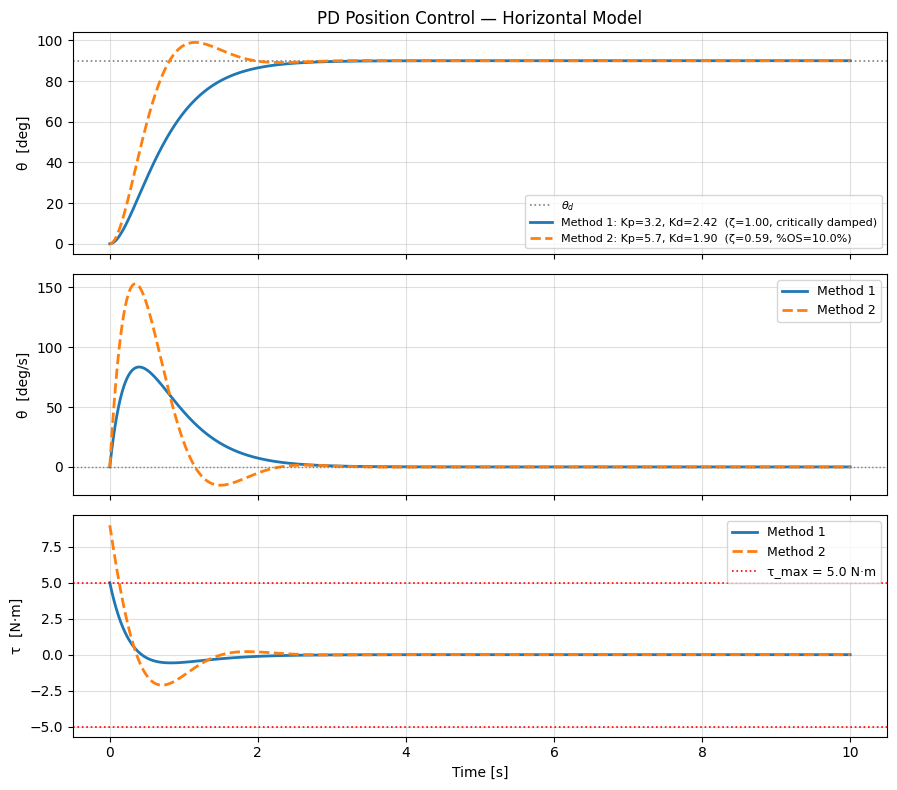

In [6]:
# -------------------------------------------------------
# Position PD Control — Horizontal Model (g = 0)
# -------------------------------------------------------

theta_d = np.pi / 2   # desired position: 90° [rad]
theta_0 = 0.0         # initial position [rad]
t_span  = (0.0, 10.0)
state0  = [theta_0, 0.0]

# -------------------------------------------------------
# Method 1: Kp set by actuator limit, Kd for ζ = 1
# -------------------------------------------------------
tau_max = 5.0   # actuator torque limit [N·m]
e0      = theta_d - theta_0   # initial error [rad]

Kp1 = tau_max / e0                      # largest Kp within actuator limit
Kd1 = 2 * np.sqrt(Kp1 * M_link) - b_link   # ζ = 1 → critically damped
zeta1  = (b_link + Kd1) / (2 * np.sqrt(Kp1 * M_link))
omega_n1 = np.sqrt(Kp1 / M_link)

print("=== Method 1: Actuator-limited Kp, critically damped ===")
print(f"  Kp = τ_max / e0 = {tau_max} / {e0:.3f} = {Kp1:.3f} N·m/rad")
print(f"  Kd = 2√(Kp·M) - b = {Kd1:.3f} N·m·s/rad")
print(f"  → ωn = {omega_n1:.3f} rad/s,  ζ = {zeta1:.3f}  (critically damped, no overshoot)")
print(f"  Peak torque at t=0: {Kp1 * e0:.2f} N·m  (= τ_max ✓)")

# -------------------------------------------------------
# Method 2: Specification-driven — %OS and settling time
# -------------------------------------------------------
percent_OS = 10.0   # desired percent overshoot [%]
t_settle   = 2.0    # desired settling time (2% criterion) [s]

ln_os  = np.log(percent_OS / 100.0)
zeta2  = -ln_os / np.sqrt(np.pi**2 + ln_os**2)
omega_n2 = 4.0 / (zeta2 * t_settle)    # 2% settling time approximation

Kp2 = M_link * omega_n2**2
Kd2 = 2 * zeta2 * omega_n2 * M_link - b_link

print("\n=== Method 2: Specification-driven (%OS, settling time) ===")
print(f"  Desired: %OS = {percent_OS}%,  t_settle = {t_settle} s")
print(f"  → ζ = {zeta2:.3f},  ωn = {omega_n2:.3f} rad/s")
print(f"  Kp = M·ωn² = {Kp2:.3f} N·m/rad")
print(f"  Kd = 2ζωn·M - b = {Kd2:.3f} N·m·s/rad")
print(f"  Peak torque at t=0: {Kp2 * e0:.2f} N·m")

# -------------------------------------------------------
# PD controller simulation
# -------------------------------------------------------
def make_pd_controller(Kp, Kd, theta_d):
    """Return a tau_func implementing τ = Kp*(θd-θ) + Kd*(0-θ̇)"""
    def tau_func(t, state):
        theta, theta_dot = state
        return Kp * (theta_d - theta) + Kd * (0.0 - theta_dot)
    return tau_func

t1, th1, dth1 = model_horizontal.simulate(make_pd_controller(Kp1, Kd1, theta_d), t_span, state0)
t2, th2, dth2 = model_horizontal.simulate(make_pd_controller(Kp2, Kd2, theta_d), t_span, state0)

# Compute torque history for each method
tau1 = np.array([Kp1*(theta_d - th) - Kd1*dth for th, dth in zip(th1, dth1)])
tau2 = np.array([Kp2*(theta_d - th) - Kd2*dth for th, dth in zip(th2, dth2)])

# -------------------------------------------------------
# Plot
# -------------------------------------------------------
fig, axes = plt.subplots(3, 1, figsize=(9, 8), sharex=True)

# Position
axes[0].axhline(np.degrees(theta_d), color="gray", linestyle=":", lw=1.2, label="$\\theta_d$")
axes[0].plot(t1, np.degrees(th1), lw=2,
             label=f"Method 1: Kp={Kp1:.1f}, Kd={Kd1:.2f}  (ζ={zeta1:.2f}, critically damped)")
axes[0].plot(t2, np.degrees(th2), lw=2, linestyle="--",
             label=f"Method 2: Kp={Kp2:.1f}, Kd={Kd2:.2f}  (ζ={zeta2:.2f}, %OS={percent_OS}%)")
axes[0].set_ylabel("θ  [deg]")
axes[0].legend(fontsize=8)
axes[0].set_title("PD Position Control — Horizontal Model")
axes[0].grid(True, alpha=0.4)

# Velocity
axes[1].plot(t1, np.degrees(dth1), lw=2,             label="Method 1")
axes[1].plot(t2, np.degrees(dth2), lw=2, linestyle="--", label="Method 2")
axes[1].axhline(0, color="gray", linestyle=":", lw=1)
axes[1].set_ylabel("θ̇  [deg/s]")
axes[1].legend(fontsize=9)
axes[1].grid(True, alpha=0.4)

# Torque
axes[2].plot(t1, tau1, lw=2,             label="Method 1")
axes[2].plot(t2, tau2, lw=2, linestyle="--", label="Method 2")
axes[2].axhline( tau_max, color="red", linestyle=":", lw=1.2, label=f"τ_max = {tau_max} N·m")
axes[2].axhline(-tau_max, color="red", linestyle=":", lw=1.2)
axes[2].set_ylabel("τ  [N·m]")
axes[2].set_xlabel("Time [s]")
axes[2].legend(fontsize=9)
axes[2].grid(True, alpha=0.4)

plt.tight_layout()
plt.show()

### Feedforward Control

For trajectory tracking, the feedforward torque is computed from the desired trajectory using the robot model (Eq. 11.32):

$$\tau(t) = \tilde{M}\,\ddot{\theta}_d(t) + \tilde{h}(\theta_d(t),\,\dot{\theta}_d(t))$$

where $\tilde{M}$ and $\tilde{h}$ denote the **controller model** (which may differ from the true robot). If the model is exact and initial conditions match, tracking is perfect. Any model mismatch causes open-loop error to accumulate.

**Desired trajectory — raised cosine (versine) profile:**

$$\theta_d(t) = c - \frac{\pi}{4}\cos(t), \quad \dot{\theta}_d(t) = \frac{\pi}{4}\sin(t), \quad \ddot{\theta}_d(t) = \frac{\pi}{4}\cos(t), \qquad 0 \le t \le \pi$$

This profile starts and ends with zero velocity, producing smooth motion between two setpoints.

**Model mismatch (Fig. 11.17):** The controller uses $\tilde{r} = 0.08$ m while the true robot has $r = 0.1$ m. This causes the gravity compensation term $\tilde{h}$ to be wrong by $mg(\tilde{r}-r)\cos\theta_d$ at every instant.

- **Task 1:** $c = -\pi/2$ — link moves upward through the lower half-plane; the controller under-compensates gravity, causing the link to move *faster* than desired.
- **Task 2:** $c = +\pi/2$ — link moves upward through the upper half-plane; under-compensation causes the link to lag *behind* the desired trajectory.

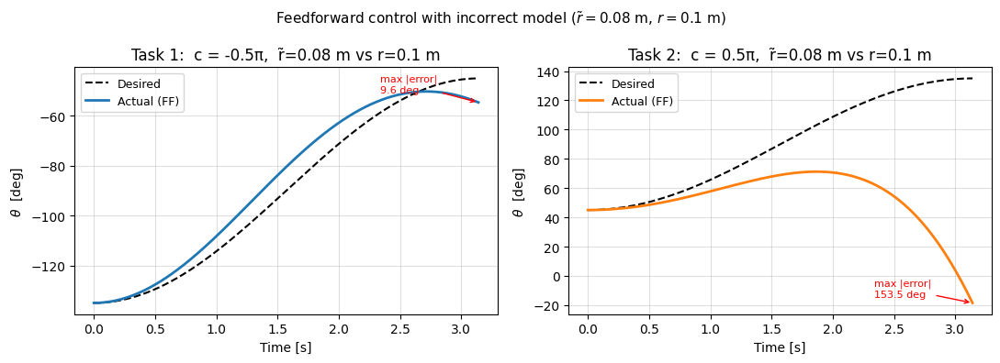

In [5]:
# -------------------------------------------------------
# Feedforward Control — Trajectory Tracking (Fig. 11.17)
# -------------------------------------------------------
# Desired trajectory: raised cosine (versine) profile
#   theta_d(t)   = c - (pi/4)*cos(t)
#   dtheta_d(t)  =     (pi/4)*sin(t)
#   ddtheta_d(t) =     (pi/4)*cos(t)   for 0 <= t <= pi

T_END = np.pi   # trajectory duration [s]

def trajectory(t, c):
    """Desired angle, velocity, and acceleration at time t."""
    td   = c - (np.pi / 4) * np.cos(t)
    dtd  =     (np.pi / 4) * np.sin(t)
    ddtd =     (np.pi / 4) * np.cos(t)
    return td, dtd, ddtd

# -------------------------------------------------------
# Feedforward controller (open-loop)
# Uses INCORRECT model: r_tilde = 0.08 m  (true r = 0.1 m)
# tau_ff(t) = M * ddtheta_d(t) + h_tilde(theta_d(t), dtheta_d(t))
# -------------------------------------------------------
r_tilde = 0.08   # controller CoM distance [m]  (wrong!)

def tau_feedforward(t, state, c):
    """Pure feedforward torque — ignores actual state, uses desired trajectory."""
    td, dtd, ddtd = trajectory(t, c)
    h_tilde = m_link * g_acc * r_tilde * np.cos(td) + b_link * dtd
    return M_link * ddtd + h_tilde

# -------------------------------------------------------
# Simulate both tasks
# -------------------------------------------------------
tasks = [
    {"name": "Task 1", "c": -np.pi / 2, "color": "tab:blue"},
    {"name": "Task 2", "c":  np.pi / 2, "color": "tab:orange"},
]

fig, axes = plt.subplots(1, 2, figsize=(11, 4))

for ax, cfg in zip(axes, tasks):
    c     = cfg["c"]
    color = cfg["color"]
    name  = cfg["name"]

    # Perfect initial conditions (no initial state error)
    theta0, dtheta0, _ = trajectory(0.0, c)
    state0 = [theta0, dtheta0]

    # Feedforward: open-loop, depends only on desired trajectory
    def make_ff(c_val):
        return lambda t, state: tau_feedforward(t, state, c_val)

    t_sim, th_actual, _ = model_vertical.simulate(make_ff(c), (0.0, T_END), state0)
    th_desired = np.array([trajectory(t, c)[0] for t in t_sim])
    error_deg  = np.degrees(th_actual - th_desired)

    ax.plot(t_sim, np.degrees(th_desired), "k--", lw=1.5, label="Desired")
    ax.plot(t_sim, np.degrees(th_actual),  color=color, lw=2, label="Actual (FF)")
    ax.set_xlabel("Time [s]")
    ax.set_ylabel(r"$\theta$  [deg]")
    ax.set_title(f"{name}:  c = {c/np.pi:.2g}\u03c0,  r\u0303={r_tilde} m vs r={r_link} m")
    ax.legend(fontsize=9)
    ax.grid(True, alpha=0.4)

    # Annotate max error
    idx = np.argmax(np.abs(error_deg))
    ax.annotate(
        f"max |error|\n{abs(error_deg[idx]):.1f} deg",
        xy=(t_sim[idx], np.degrees(th_actual[idx])),
        xytext=(t_sim[idx] - 0.8, np.degrees(th_actual[idx]) + 4),
        arrowprops=dict(arrowstyle="->", color="red"),
        fontsize=8, color="red",
    )

fig.suptitle(
    r"Feedforward control with incorrect model ($\tilde{r}=0.08$ m, $r=0.1$ m)",
    fontsize=11,
)
plt.tight_layout()
plt.show()

### Feedforward + Feedback: Computed Torque Control

For trajectory tracking, the **computed torque controller** (Eq. 11.35) combines feedforward and PD feedback:

$$\tau(t) = \underbrace{\tilde{M}\,\ddot{\theta}_d + \tilde{h}(\theta_d,\dot{\theta}_d)}_{\tau_{ff}} + \underbrace{K_p(\theta_d - \theta) + K_d(\dot{\theta}_d - \dot{\theta})}_{\tau_{fb}}$$

The feedforward term anticipates what torque is needed based on the desired motion and it pre-cancels the known dynamics; the PD feedback corrects residual errors from model mismatch or disturbances. When the model is exact the feedback term is zero. With model mismatch it acts as a corrector, yielding better tracking than either term alone.

**Three controllers compared (Task 2 trajectory, $c=\pi/2$):**

| Controller | Torque law | Characteristics |
|---|---|---|
| FF only | $\tilde{M}\ddot{\theta}_d + \tilde{h}(\theta_d,\dot{\theta}_d)$ | Open-loop; large error if model wrong |
| FB only (PD) | $K_p(\theta_d-\theta)+K_d(\dot{\theta}_d-\dot{\theta})$ | Reactive; some lag/overshoot; high effort |
| FF+FB (CT) | Sum of above | Best tracking; less effort than FB alone |

The right-hand plot in Fig. 11.19 shows $\int\tau^2\,dt$, a standard measure of cumulative control effort.

PD gains:  Kp = 4.199 N*m/rad,  Kd = 1.900 N*m*s/rad
           zeta = 0.690,  omega_n = 2.898 rad/s


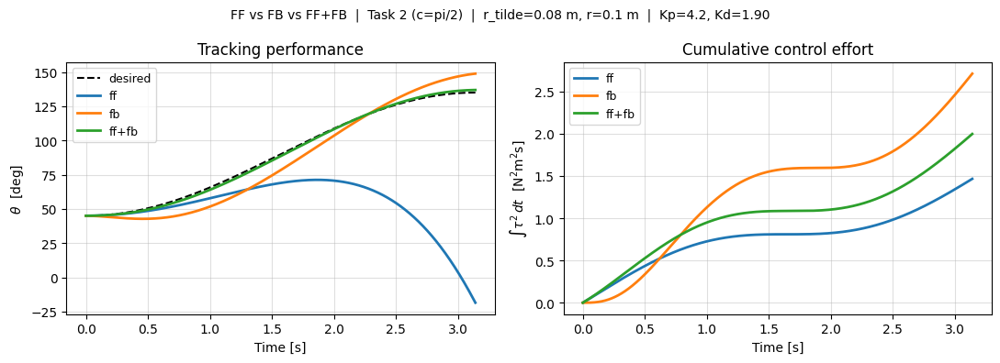

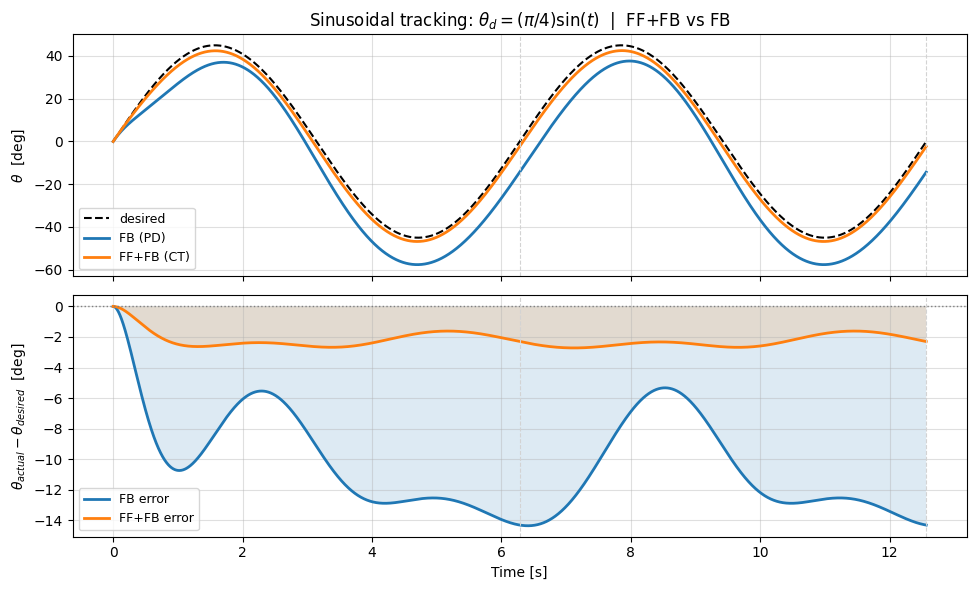

Sinusoidal tracking RMS error:
  FB only : 10.891 deg
  FF+FB   : 2.253 deg
  Reduction: 79.3%


In [6]:
# =======================================================
# Feedforward + Feedback (Computed Torque) - Fig. 11.19
# =======================================================

# -------------------------------------------------------
# PD gains (design: %OS = 5%, t_settle = 2 s)
# -------------------------------------------------------
percent_OS_fb = 5.0 # percent overshoot
t_settle_fb   = 2.0 # settling time in seconds
ln_os_fb   = np.log(percent_OS_fb / 100.0) # natural log of overshoot
zeta_fb    = -ln_os_fb / np.sqrt(np.pi**2 + ln_os_fb**2) # damping ratio
omega_n_fb = 4.0 / (zeta_fb * t_settle_fb) # natural frequency
Kp_fb = M_link * omega_n_fb**2 # proportional gain
Kd_fb = 2 * zeta_fb * omega_n_fb * M_link - b_link # derivative gain
print(f"PD gains:  Kp = {Kp_fb:.3f} N*m/rad,  Kd = {Kd_fb:.3f} N*m*s/rad")
print(f"           zeta = {zeta_fb:.3f},  omega_n = {omega_n_fb:.3f} rad/s")

# -------------------------------------------------------
# Task 2 desired trajectory  c = pi/2
# -------------------------------------------------------
c_task2 = np.pi / 2

def traj(t, c=None):
    if c is None: c = c_task2
    td   = c - (np.pi / 4) * np.cos(t)
    dtd  =     (np.pi / 4) * np.sin(t)
    ddtd =     (np.pi / 4) * np.cos(t)
    return td, dtd, ddtd

# -------------------------------------------------------
# Three controller torque functions
# -------------------------------------------------------
def tau_ff(t, state):
    td, dtd, ddtd = traj(t)
    h_tilde = m_link * g_acc * r_tilde * np.cos(td) + b_link * dtd
    return M_link * ddtd + h_tilde

def tau_fb(t, state):
    theta, theta_dot = state
    td, dtd, _ = traj(t)
    return Kp_fb * (td - theta) + Kd_fb * (dtd - theta_dot)

def tau_fffb(t, state):
    return tau_ff(t, state) + tau_fb(t, state)

# -------------------------------------------------------
# Simulate all three on the TRUE vertical model
# -------------------------------------------------------
theta0, dtheta0, _ = traj(0.0)
state0 = [theta0, dtheta0]
t_span = (0.0, T_END)

t_ff, th_ff, _       = model_vertical.simulate(tau_ff,   t_span, state0)
t_fb, th_fb, dth_fb  = model_vertical.simulate(tau_fb,   t_span, state0)
t_ct, th_ct, dth_ct  = model_vertical.simulate(tau_fffb, t_span, state0)
th_des = np.array([traj(t)[0] for t in t_ff])

# Torque histories
tau_ff_hist = np.array([tau_ff(t,  [th, dth]) for t, th, dth in zip(t_ff, th_ff, np.gradient(th_ff, t_ff))])
tau_fb_hist = np.array([tau_fb(t,  [th, dth]) for t, th, dth in zip(t_fb, th_fb, dth_fb)])
tau_ct_hist = np.array([tau_fffb(t, [th, dth]) for t, th, dth in zip(t_ct, th_ct, dth_ct)])

# Cumulative control effort: integral of tau^2
def cum_effort(t, tau):
    dt = np.diff(t, prepend=t[0])
    return np.cumsum(tau**2 * dt)

effort_ff = cum_effort(t_ff, tau_ff_hist)
effort_fb = cum_effort(t_fb, tau_fb_hist)
effort_ct = cum_effort(t_ct, tau_ct_hist)

# -------------------------------------------------------
# Figure 1: Tracking + Control Effort (Fig. 11.19)
# -------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(11, 4))

ax = axes[0]
ax.plot(t_ff, np.degrees(th_des), "k--", lw=1.5, label="desired")
ax.plot(t_ff, np.degrees(th_ff),  lw=2, label="ff")
ax.plot(t_fb, np.degrees(th_fb),  lw=2, label="fb")
ax.plot(t_ct, np.degrees(th_ct),  lw=2, label="ff+fb")
ax.set_xlabel("Time [s]")
ax.set_ylabel(r"$\theta$  [deg]")
ax.set_title("Tracking performance")
ax.legend(fontsize=9)
ax.grid(True, alpha=0.4)

ax = axes[1]
ax.plot(t_ff, effort_ff, lw=2, label="ff")
ax.plot(t_fb, effort_fb, lw=2, label="fb")
ax.plot(t_ct, effort_ct, lw=2, label="ff+fb")
ax.set_xlabel("Time [s]")
ax.set_ylabel(r"$\int \tau^2\,dt$  [N$^2$m$^2$s]")
ax.set_title("Cumulative control effort")
ax.legend(fontsize=9)
ax.grid(True, alpha=0.4)

fig.suptitle(
    f"FF vs FB vs FF+FB  |  Task 2 (c=pi/2)  |"
    f"  r_tilde={r_tilde} m, r={r_link} m  |  Kp={Kp_fb:.1f}, Kd={Kd_fb:.2f}",
    fontsize=10,
)
plt.tight_layout()
plt.show()

# =======================================================
# Sinusoidal Trajectory: FF+FB vs FB
# =======================================================
omega_sin = 1.0
A_sin     = np.pi / 4
t_sin_end = 4 * np.pi

def traj_sin(t):
    td   =  A_sin * np.sin(omega_sin * t)
    dtd  =  A_sin * omega_sin * np.cos(omega_sin * t)
    ddtd = -A_sin * omega_sin**2 * np.sin(omega_sin * t)
    return td, dtd, ddtd

def tau_ff_sin(t, state):
    td, dtd, ddtd = traj_sin(t)
    h_tilde = m_link * g_acc * r_tilde * np.cos(td) + b_link * dtd
    return M_link * ddtd + h_tilde

def tau_fb_sin(t, state):
    theta, theta_dot = state
    td, dtd, _ = traj_sin(t)
    return Kp_fb * (td - theta) + Kd_fb * (dtd - theta_dot)

def tau_fffb_sin(t, state):
    return tau_ff_sin(t, state) + tau_fb_sin(t, state)

th0_sin, dth0_sin, _ = traj_sin(0.0)
state0_sin = [th0_sin, dth0_sin]
t_span_sin = (0.0, t_sin_end)

t_s_fb, th_s_fb, dth_s_fb = model_vertical.simulate(tau_fb_sin,   t_span_sin, state0_sin)
t_s_ct, th_s_ct, dth_s_ct = model_vertical.simulate(tau_fffb_sin, t_span_sin, state0_sin)
th_s_des = np.array([traj_sin(t)[0] for t in t_s_fb])

err_fb = np.degrees(th_s_fb - th_s_des)
err_ct = np.degrees(th_s_ct - th_s_des)

fig, axes = plt.subplots(2, 1, figsize=(10, 6), sharex=True)

axes[0].plot(t_s_fb, np.degrees(th_s_des), "k--", lw=1.5, label="desired")
axes[0].plot(t_s_fb, np.degrees(th_s_fb),  lw=2, label="FB (PD)")
axes[0].plot(t_s_ct, np.degrees(th_s_ct),  lw=2, label="FF+FB (CT)")
axes[0].set_ylabel(r"$\theta$  [deg]")
axes[0].set_title(
    r"Sinusoidal tracking: $\theta_d = (\pi/4)\sin(t)$  |  FF+FB vs FB"
)
axes[0].legend(fontsize=9)
axes[0].grid(True, alpha=0.4)

axes[1].plot(t_s_fb, err_fb, lw=2, label="FB error")
axes[1].plot(t_s_ct, err_ct, lw=2, label="FF+FB error")
axes[1].axhline(0, color="gray", linestyle=":", lw=1)
axes[1].fill_between(t_s_fb, err_fb, 0, alpha=0.15)
axes[1].fill_between(t_s_ct, err_ct, 0, alpha=0.15)
axes[1].set_ylabel(r"$\theta_{actual} - \theta_{desired}$  [deg]")
axes[1].set_xlabel("Time [s]")
axes[1].legend(fontsize=9)
axes[1].grid(True, alpha=0.4)

# Mark period boundaries
T_period = 2 * np.pi / omega_sin
for k in range(1, int(t_sin_end / T_period) + 1):
    axes[0].axvline(k * T_period, color="lightgray", lw=0.8, linestyle="--")
    axes[1].axvline(k * T_period, color="lightgray", lw=0.8, linestyle="--")

plt.tight_layout()
plt.show()

rms_fb = np.sqrt(np.mean(err_fb**2))
rms_ct = np.sqrt(np.mean(err_ct**2))
print(f"Sinusoidal tracking RMS error:")
print(f"  FB only : {rms_fb:.3f} deg")
print(f"  FF+FB   : {rms_ct:.3f} deg")
print(f"  Reduction: {(1 - rms_ct/rms_fb)*100:.1f}%")


## Task 2: Control of a Single Joint Robotic Arm Using MuJoCo

So far the controller and the simulated plant share the same Python model. To better reflect real-world deployment, we now use **MuJoCo as the true physical system** and the analytical `SingleJointModel` as the controller's internal model.

The MuJoCo model is built to match the textbook parameters ($M=0.5$ kg $\cdot$ m $^2$, $m=1$ kg, $r=0.1$ m, $b=0.1$ N $\cdot$ m $\cdot$ s/rad). The controller uses the computed torque law:

$$\tau = \tilde{M}\,\ddot{\theta}_d + \tilde{h}(\theta_d,\dot{\theta}_d) + K_p(\theta_d - \theta) + K_d(\dot{\theta}_d - \dot{\theta})$$

Two scenarios are compared:

| Scenario | Controller model | MuJoCo (true) | Mismatch |
|---|---|---|---|
| Matched | $\tilde{r}=0.1$ m | $r=0.1$ m | None — FF cancels dynamics exactly |
| Mismatched | $\tilde{r}=0.08$ m | $r=0.1$ m | $\Delta r=0.02$ m — FB must compensate |

This demonstrates that even with an imperfect model, the PD feedback term keeps the system on track — though at the cost of larger control effort than the matched case.

Running MuJoCo simulation - matched model (r_ctrl = 0.1)...
Running MuJoCo simulation - mismatched model (r_ctrl = 0.08)...
Done.


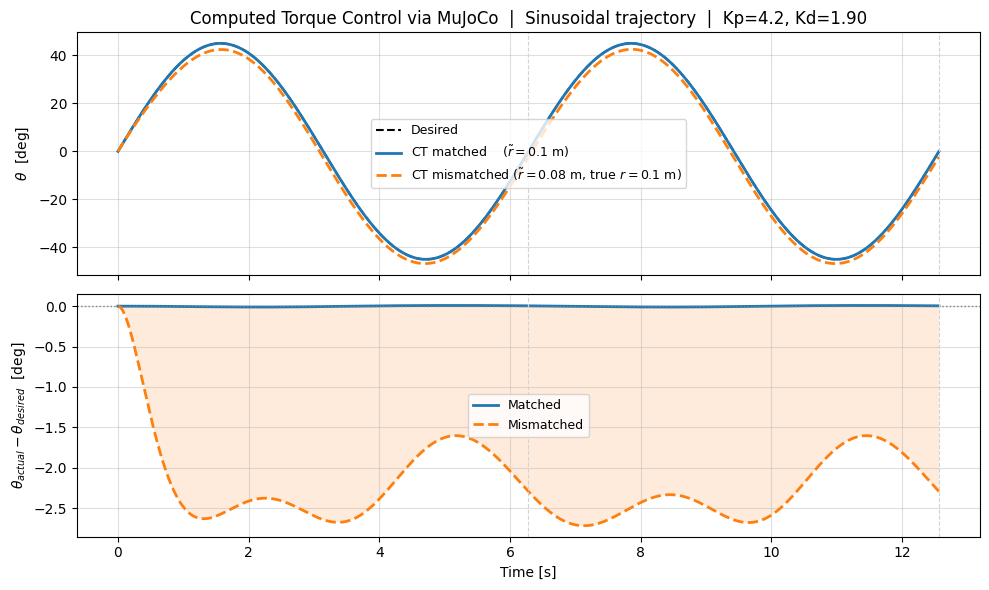

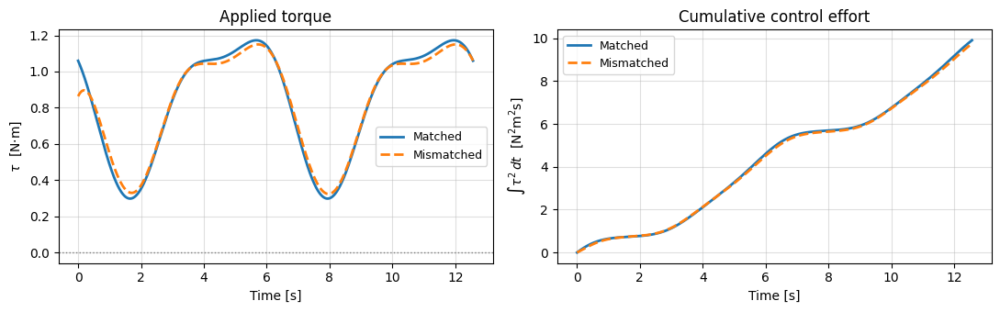

MuJoCo CT control RMS tracking error:
  Matched model    (r_ctrl=0.1):   0.0069 deg
  Mismatched model (r_ctrl=0.08): 2.2551 deg
  Mismatch penalty: 2.2481 deg  (FB compensates 0%)


In [7]:
# -------------------------------------------------------
# MuJoCo model: single revolute joint (pendulum)
#
# Parameters match analytical model:
#   joint damping b = 0.1 N*m*s/rad
#   link mass m = 1.0 kg, CoM at r = 0.1 m from joint
#   rotational inertia about joint M = 0.5 kg*m^2
#     -> I_cm_y = M - m*r^2 = 0.5 - 0.01 = 0.49 kg*m^2  (parallel axis)
# -------------------------------------------------------
single_joint_xml = """
<mujoco model="single_joint_arm">
  <option gravity="0 0 -9.81" timestep="0.001"/>
  <worldbody>
    <geom type="sphere" size="0.05" rgba="0.4 0.4 0.4 1"/>
    <body name="link">
      <joint name="j1" type="hinge" axis="0 -1 0" damping="0.1"/>
      <inertial pos="0.1 0 0" mass="1.0" diaginertia="0.001 0.49 0.49"/>
      <geom type="capsule" fromto="0 0 0 0.2 0 0" size="0.02" rgba="0.8 0.3 0.3 1"/>
      <geom type="sphere" pos="0.1 0 0" size="0.025" rgba="0.2 0.6 0.2 1"/>
    </body>
  </worldbody>
  <actuator>
    <motor name="m1" joint="j1" gear="1" ctrlrange="-20 20"/>
  </actuator>
</mujoco>
"""

# -------------------------------------------------------
# Computed torque controller (uses analytical model internally)
# r_ctrl: the CoM distance the CONTROLLER believes (may differ from MuJoCo)
# -------------------------------------------------------
def ct_torque(t, theta, theta_dot, traj_func, r_ctrl):
    td, dtd, ddtd = traj_func(t)
    # Feedforward using controller model
    h_ctrl = m_link * g_acc * r_ctrl * np.cos(td) + b_link * dtd
    tau_ff_val = M_link * ddtd + h_ctrl
    # PD feedback on tracking error
    tau_fb_val = Kp_fb * (td - theta) + Kd_fb * (dtd - theta_dot)
    return tau_ff_val + tau_fb_val

# -------------------------------------------------------
# MuJoCo simulation loop
# -------------------------------------------------------
def run_mujoco(traj_func, r_ctrl, duration, tau_limit=20.0):
    mj_m = mujoco.MjModel.from_xml_string(single_joint_xml)
    mj_d = mujoco.MjData(mj_m)
    # Set initial conditions to match trajectory start
    th0, dth0, _ = traj_func(0.0)
    mj_d.qpos[0] = th0
    mj_d.qvel[0] = dth0
    mujoco.mj_forward(mj_m, mj_d)

    times, thetas, theta_dots, taus = [], [], [], []
    while mj_d.time < duration:
        t      = mj_d.time
        theta  = mj_d.qpos[0]
        thetad = mj_d.qvel[0]
        tau    = ct_torque(t, theta, thetad, traj_func, r_ctrl)
        tau    = float(np.clip(tau, -tau_limit, tau_limit)) # clip torque to actuator limits
        mj_d.ctrl[0] = tau # apply computed torque to MuJoCo actuator
        times.append(t)
        thetas.append(theta)
        theta_dots.append(thetad)
        taus.append(tau)
        mujoco.mj_step(mj_m, mj_d) # advance MuJoCo simulation by one timestep

    return (np.array(times), np.array(thetas),
            np.array(theta_dots), np.array(taus))

# -------------------------------------------------------
# Simulate: sinusoidal trajectory, two mismatch scenarios
# -------------------------------------------------------
duration_mj = t_sin_end   # reuse sinusoidal trajectory from above

print("Running MuJoCo simulation - matched model (r_ctrl = 0.1)...")
t_match, th_match, _, tau_match = run_mujoco(traj_sin, r_ctrl=r_link,   duration=duration_mj)
print("Running MuJoCo simulation - mismatched model (r_ctrl = 0.08)...")
t_mis,   th_mis,   _, tau_mis   = run_mujoco(traj_sin, r_ctrl=r_tilde,  duration=duration_mj)
print("Done.")

# Desired trajectory sampled at MuJoCo timesteps
th_des_mj   = np.array([traj_sin(t)[0] for t in t_match])
err_match   = np.degrees(th_match - th_des_mj)
err_mis     = np.degrees(th_mis   - np.array([traj_sin(t)[0] for t in t_mis]))

# -------------------------------------------------------
# Figure 1: Trajectory tracking
# -------------------------------------------------------
fig, axes = plt.subplots(2, 1, figsize=(10, 6), sharex=True)

axes[0].plot(t_match, np.degrees(th_des_mj), "k--", lw=1.5, label="Desired")
axes[0].plot(t_match, np.degrees(th_match),  lw=2,  label=f"CT matched    ($\\tilde{{r}}={r_link}$ m)")
axes[0].plot(t_mis,   np.degrees(th_mis),    lw=2,  linestyle="--",
             label=f"CT mismatched ($\\tilde{{r}}={r_tilde}$ m, true $r={r_link}$ m)")
axes[0].set_ylabel(r"$\theta$  [deg]")
axes[0].set_title(
    f"Computed Torque Control via MuJoCo  |  "
    f"Sinusoidal trajectory  |  Kp={Kp_fb:.1f}, Kd={Kd_fb:.2f}"
)
axes[0].legend(fontsize=9)
axes[0].grid(True, alpha=0.4)

axes[1].plot(t_match, err_match, lw=2, label="Matched")
axes[1].plot(t_mis,   err_mis,   lw=2, linestyle="--", label="Mismatched")
axes[1].axhline(0, color="gray", linestyle=":", lw=1)
axes[1].fill_between(t_match, err_match, 0, alpha=0.15)
axes[1].fill_between(t_mis,   err_mis,   0, alpha=0.15)
axes[1].set_ylabel(r"$\theta_{actual} - \theta_{desired}$  [deg]")
axes[1].set_xlabel("Time [s]")
axes[1].legend(fontsize=9)
axes[1].grid(True, alpha=0.4)

T_period_mj = 2 * np.pi / omega_sin
for k in range(1, int(duration_mj / T_period_mj) + 1):
    axes[0].axvline(k * T_period_mj, color="lightgray", lw=0.8, linestyle="--")
    axes[1].axvline(k * T_period_mj, color="lightgray", lw=0.8, linestyle="--")

plt.tight_layout()
plt.show()

# -------------------------------------------------------
# Figure 2: Torque comparison
# -------------------------------------------------------
effort_match = np.cumsum(tau_match**2 * np.diff(t_match, prepend=t_match[0]))
effort_mis   = np.cumsum(tau_mis**2   * np.diff(t_mis,   prepend=t_mis[0]))

fig, axes = plt.subplots(1, 2, figsize=(11, 3.5))

axes[0].plot(t_match, tau_match, lw=2, label="Matched")
axes[0].plot(t_mis,   tau_mis,   lw=2, linestyle="--", label="Mismatched")
axes[0].axhline(0, color="gray", linestyle=":", lw=1)
axes[0].set_ylabel(r"$\tau$  [N$\cdot$m]")
axes[0].set_xlabel("Time [s]")
axes[0].set_title("Applied torque")
axes[0].legend(fontsize=9)
axes[0].grid(True, alpha=0.4)

axes[1].plot(t_match, effort_match, lw=2, label="Matched")
axes[1].plot(t_mis,   effort_mis,   lw=2, linestyle="--", label="Mismatched")
axes[1].set_ylabel(r"$\int\tau^2\,dt$  [N$^2$m$^2$s]")
axes[1].set_xlabel("Time [s]")
axes[1].set_title("Cumulative control effort")
axes[1].legend(fontsize=9)
axes[1].grid(True, alpha=0.4)

plt.tight_layout()
plt.show()

# Summary
rms_match = np.sqrt(np.mean(err_match**2))
rms_mis   = np.sqrt(np.mean(err_mis**2))
print(f"MuJoCo CT control RMS tracking error:")
print(f"  Matched model    (r_ctrl={r_link}):   {rms_match:.4f} deg")
print(f"  Mismatched model (r_ctrl={r_tilde}): {rms_mis:.4f} deg")
print(f"  Mismatch penalty: {rms_mis - rms_match:.4f} deg  "
      f"(FB compensates {(1-rms_mis/rms_match)*100 if rms_mis < rms_match else 0:.0f}%)")


## Task 3: Control of a 2R Planar Robot Using MuJoCo

In Tasks 1 and 2, we designed and verified computed torque control for a single-joint arm. Here we extend the approach to a **2R planar robot**, and use MuJoCo as the plant for both simulation and dynamics extraction.

### Dynamics

The joint-space equations of motion are:

$$\mathbf{M}(\mathbf{q})\ddot{\mathbf{q}} + \mathbf{C}(\mathbf{q},\dot{\mathbf{q}})\dot{\mathbf{q}} = \boldsymbol{\tau}$$

where $\mathbf{q} = [q_1, q_2]^\top$ are the joint angles, $\mathbf{M}(\mathbf{q})$ is the $2\times2$ inertia matrix, and $\mathbf{C}(\mathbf{q},\dot{\mathbf{q}})\dot{\mathbf{q}}$ collects Coriolis and centrifugal terms. Gravity is disabled in this horizontal planar setup.

MuJoCo exposes these terms directly:
- `mujoco.mj_crba(model, data)` runs the **Composite Rigid-Body Algorithm (CRBA)** at the current joint configuration `data.qpos` to assemble the joint-space inertia in MuJoCo’s internal sparse format (`data.qM`).
- `mujoco.mj_fullM(model, M_full, data.qM)` converts that internal representation into a dense matrix `M_full`, giving the explicit inertia matrix $\mathbf{M}(\mathbf{q}) \in \mathbb{R}^{2\times2}$ used in computed-torque control.
- `data.qfrc_bias` is MuJoCo’s bias-force vector evaluated at the current state (`q`, `\dot q`), containing velocity-dependent terms (Coriolis/centrifugal) and gravity contributions; with gravity disabled, it mainly represents $\mathbf{C}(\mathbf{q},\dot{\mathbf{q}})\dot{\mathbf{q}}$.


We first create the MuJoCo model.


In [9]:
import os
import mujoco
import numpy as np
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML, display

# ── Robot parameters (matching Task 4) ────────────────────────────────────────
m1, m2 = 1.0, 0.8      # link masses [kg]
l1, l2 = 0.5, 0.4      # link lengths [m]

# Inertia of each link as a uniform rod, about COM: I = m*L^2/12
I1_zz = m1 * l1**2 / 12
I2_zz = m2 * l2**2 / 12

# ── Step 1: Create the MuJoCo XML ─────────────────────────────────────────────
# - Robot in the XY plane, joints rotate about Z-axis
# - You can assign gravity to either enable or disable gravity term in EOM
# - <inertial> tags set exact uniform-rod inertia to match the analytical model
xml_content = f"""<mujoco model="2r_planar_robot">
  <option gravity="0 0 0" timestep="0.002" integrator="RK4"/>
  <compiler balanceinertia="true"/>

  <default>
    <joint damping="0" frictionloss="0"/>
    <motor ctrllimited="false"/>
  </default>

  <worldbody>
    <camera name="xy_plane" pos="0 0 2" euler="0 0 0" fovy="60"/>
    <light pos="0 0 3" dir="0 0 -1"/>

    <!-- Link 1: hinge at origin, uniform-rod inertia about COM -->
    <body name="link1" pos="0 0 0">
      <joint name="joint1" type="hinge" axis="0 0 1"/>
      <! We set Ixx = Iyy = I_zz/2 so that it satisfies MuJoCo's triangle inequality (A + B ≥ C)>
      <!Only Izz actually affects the dynamics. Ixx and Iyy are never "activated" in this planar setup>
      <!they're just dummy values chosen to satisfy MuJoCo's requirement.>
      <inertial pos="{l1/2:.4f} 0 0" mass="{m1}"
                diaginertia="{I1_zz/2:.6f} {I1_zz/2:.6f} {I1_zz:.6f}"/>
      <geom type="capsule" fromto="0 0 0 {l1} 0 0" size="0.025"
            rgba="0.2 0.6 0.9 1" mass="0"/>

      <!-- Link 2: hinge at end of link1 -->
      <body name="link2" pos="{l1} 0 0">
        <joint name="joint2" type="hinge" axis="0 0 1"/>
        <inertial pos="{l2/2:.4f} 0 0" mass="{m2}"
                  diaginertia="{I2_zz/2:.6f} {I2_zz/2:.6f} {I2_zz:.6f}"/>
        <geom type="capsule" fromto="0 0 0 {l2} 0 0" size="0.02"
              rgba="0.9 0.4 0.2 1" mass="0"/>
        <site name="end_effector" pos="{l2} 0 0" size="0.03" rgba="1 0 0 1"/>
      </body>
    </body>
  </worldbody>

  <actuator>
    <motor name="tau1" joint="joint1"/>
    <motor name="tau2" joint="joint2"/>
  </actuator>
</mujoco>"""

xml_path = "2r_robot.xml"
with open(xml_path, "w") as f:
    f.write(xml_content)
print(f"XML saved: {xml_path}")

# ── Step 2: Load MuJoCo model ──────────────────────────────────────────────────
model = mujoco.MjModel.from_xml_path(xml_path)
data  = mujoco.MjData(model)

XML saved: 2r_robot.xml


### Task 3.1: Reaching Task

**Goal:** Drive the end-effector to a random reachable target point $\mathbf{x}^* \in \mathbb{R}^2$ from an arbitrary initial configuration. We will use the PD controller and the computed torque controller.


#### PD Feedback Controller without Feedforward -- Joint Space

We can achieve this using a PD controller.
$$\boldsymbol{\tau} = K_d\,\dot{\mathbf{e}} + K_p\,\mathbf{e}$$

where $\mathbf{e} = \mathbf{q}_d - \mathbf{q}$ and $\dot{\mathbf{e}} = \dot{\mathbf{q}}_d - \dot{\mathbf{q}}$. Note that $\mathbf{e}\in \mathbb{R}^2$ is a two-dimensional vector.

#### Computed Torque Control -- Joint Space

For **set-point control** (reaching a target joint configuration $\mathbf{q}_d$):

$$\boldsymbol{\tau} = \mathbf{M}(\mathbf{q})\left(\ddot{\mathbf{q}}_d + K_d\,\dot{\mathbf{e}} + K_p\,\mathbf{e}\right) + \mathbf{C}(\mathbf{q},\dot{\mathbf{q}})\dot{\mathbf{q}}$$

With a constant target ($\ddot{\mathbf{q}}_d = \mathbf{0}$), the bias term cancels and the closed-loop error dynamics decouple into two independent second-order systems:

$$\ddot{\mathbf{e}} + K_d\,\dot{\mathbf{e}} + K_p\,\mathbf{e} = \mathbf{0}$$

**Approach:**
1. Sample a random target inside the reachable workspace (annulus: $|l_1 - l_2| < r < l_1 + l_2$)
2. Solve analytical inverse kinematics (IK) to obtain the desired joint angles $\mathbf{q}_d$
3. Apply joint-space PD controller or computed torque controller to drive $\mathbf{q} \to \mathbf{q}_d$

**Inverse Kinematics (2R planar, elbow-up):**

$$q_2 = \arccos\!\left(\frac{p_x^2 + p_y^2 - l_1^2 - l_2^2}{2\,l_1 l_2}\right)$$

$$q_1 = \arctan2(p_y,\, p_x) - \arctan2\!\left(l_2\sin q_2,\; l_1 + l_2\cos q_2\right)$$

**Gain design:** Choosing natural frequency $\omega_n$ and damping ratio $\zeta$ for the error dynamics $\ddot{e} + K_d\dot{e} + K_p e = 0$:

$$K_p = \omega_n^2, \qquad K_d = 2\zeta\omega_n$$

These values are chosen to match the standard second-order form
$$
\ddot{e}+2\zeta\omega_n\dot{e}+\omega_n^2 e=0.
$$
So, $\omega_n$ directly sets response speed (larger $\omega_n$ $\rightarrow$ faster convergence), and $\zeta$ sets damping/overshoot ($\zeta\approx 1$ gives fast, well-damped motion with little overshoot).


In [10]:
# -----------------------------------------------------------------------
# Task 3.1: Reaching Task - PD vs Computed Torque Control (Joint Space)
# -----------------------------------------------------------------------

# ---- Helper functions --------------------------------------------------

def fk_2r(q, l1, l2):
    """Forward kinematics: joint angles -> end-effector (x, y)."""
    x = l1 * np.cos(q[0]) + l2 * np.cos(q[0] + q[1])
    y = l1 * np.sin(q[0]) + l2 * np.sin(q[0] + q[1])
    return np.array([x, y])

def jacobian_2r(q, l1, l2):
    """2x2 geometric Jacobian of the 2R planar robot."""
    s1  = np.sin(q[0]);        c1  = np.cos(q[0])
    s12 = np.sin(q[0]+q[1]);   c12 = np.cos(q[0]+q[1])
    return np.array([
        [-l1*s1 - l2*s12,  -l2*s12],
        [ l1*c1 + l2*c12,   l2*c12]
    ])

def jdot_qdot_2r(q, qd, l1, l2):
    """Jdot @ qdot: centripetal acceleration term for 2R robot."""
    c1  = np.cos(q[0]);        s1  = np.sin(q[0])
    c12 = np.cos(q[0]+q[1]);   s12 = np.sin(q[0]+q[1])
    q1d, q12d = qd[0], qd[0] + qd[1]
    ax = -l1*c1*q1d**2 - l2*c12*q12d**2
    ay = -l1*s1*q1d**2 - l2*s12*q12d**2
    return np.array([ax, ay])

def ik_2r(px, py, l1, l2, elbow_up=True):
    """Analytical IK for 2R planar robot (elbow-up or elbow-down)."""
    D = (px**2 + py**2 - l1**2 - l2**2) / (2.0 * l1 * l2)
    D = np.clip(D, -1.0, 1.0)
    q2 = np.arccos(D) if elbow_up else -np.arccos(D)
    q1 = np.arctan2(py, px) - np.arctan2(l2*np.sin(q2), l1 + l2*np.cos(q2))
    return np.array([q1, q2])

def get_mass_matrix(model, data):
    """Extract the full mass matrix M(q) from MuJoCo."""
    M_full = np.zeros((model.nv, model.nv))  # initialize mass matrix
    mujoco.mj_fullM(model, M_full, data.qM) # compute the full inertia matrix
    return M_full

def pd_joint_torque(data, q_d, Kp, Kd):
    """Simple joint-space PD: tau = Kp*(q_d - q) + Kd*(0 - qdot).
    No model knowledge -- treats each joint independently.
    """
    e  =  q_d - data.qpos
    ed = -data.qvel          # desired velocity = 0 for set-point
    return Kp * e + Kd * ed

def ct_joint_torque(model, data, q_d, Kp, Kd):
    """Computed torque: tau = M(q)*(Kp*e + Kd*ed) + bias.
    Cancels inertia coupling and Coriolis -- decoupled linear error dynamics.
    """
    e  =  q_d - data.qpos
    ed = -data.qvel
    M    = get_mass_matrix(model, data)
    bias = data.qfrc_bias.copy()  # Coriolis, centrifugal, and gravity terms
    return M @ (Kp * e + Kd * ed) + bias

# ---- Random reachable target -------------------------------------------
rng   = np.random.default_rng(seed=42)
r_min = abs(l1 - l2) + 0.05  # minimum reachable radius
r_max = l1 + l2 - 0.05       # maximum reachable radius

r_tgt     = rng.uniform(r_min, r_max)  # random target radius
th_tgt    = rng.uniform(-np.pi, np.pi)  # random target angle
target_xy = r_tgt * np.array([np.cos(th_tgt), np.sin(th_tgt)])  # target position in XY
q_des     = ik_2r(target_xy[0], target_xy[1], l1, l2, elbow_up=True)  # desired joint angles
q0        = np.array([0.2, 0.3])   # shared initial configuration, you may change this

print(f'Target:        ({target_xy[0]:.3f}, {target_xy[1]:.3f}) m')
print(f'Desired joints: q1={np.degrees(q_des[0]):.1f} deg,  q2={np.degrees(q_des[1]):.1f} deg')

# ---- Controller gains -------------------------------------------------
# CT: gains directly set error dynamics wn = sqrt(Kp), zeta = Kd/(2*wn)
#     because M(q) is fully cancelled -> decoupled linear response.
wn_ct   = 10.0
zeta_ct = 0.9
Kp_ct   = wn_ct**2               # 100
Kd_ct   = 2 * zeta_ct * wn_ct   # 18

# PD: no inertia cancellation -> effective wn_eff = sqrt(Kp/M_eff).
#     Needs higher Kp to drive the same convergence speed against the
#     actual inertia (M_eff ~ 0.3 kg*m^2 for joint 1, ~0.04 for joint 2).
Kp_pd   = 40
Kd_pd   = 1

# ---- Simulation helper ------------------------------------------------
def run_sim(ctrl_fn):
    mujoco.mj_resetData(model, data)
    data.qpos[:] = q0
    data.qvel[:] = [0.0, 0.0]
    mujoco.mj_forward(model, data)
    n  = int(T_sim / model.opt.timestep)
    tl = np.zeros(n);  ql = np.zeros((n, 2))
    tl2 = np.zeros((n, 2));  el = np.zeros((n, 2))

    for k in range(n):
        tau = ctrl_fn()
        data.ctrl[:] = tau
        mujoco.mj_step(model, data)
        tl[k]  = data.time
        ql[k]  = data.qpos.copy()
        tl2[k] = tau
        el[k]  = fk_2r(data.qpos, l1, l2)
    return tl, ql, tl2, el

T_sim = 3.0

#conduct simulation for PD controller
t_pd,  q_pd,  tau_pd,  ee_pd  = run_sim(
    lambda: pd_joint_torque(data, q_des, Kp_pd, Kd_pd))

#conduct simulation for CT controller
t_ct,  q_ct,  tau_ct,  ee_ct  = run_sim(
    lambda: ct_joint_torque(model, data, q_des, Kp_ct, Kd_ct))

# ---- Static comparison plots ------------------------------------------
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
fig.suptitle('Task 3.1: Reaching Task - PD vs Computed Torque Control', fontsize=13)

# --- Joint angle errors
for j, (ax, joint, col) in enumerate(zip(axes[0, :2],
                                          ['Joint 1', 'Joint 2'],
                                          [0, 1])):
    ax.plot(t_pd, np.degrees(q_pd[:, col] - q_des[col]), 'C1', label='PD')
    ax.plot(t_ct, np.degrees(q_ct[:, col] - q_des[col]), 'C0', label='CT')
    ax.axhline(0, color='k', lw=0.8, ls='--')
    ax.set_xlabel('Time [s]'); ax.set_ylabel('Error [deg]')
    ax.set_title(f'{joint} Error'); ax.legend(); ax.grid(True)

# --- EE path in XY
ax = axes[0, 2]
ax.set_aspect('equal')
theta_ws = np.linspace(0, 2*np.pi, 300)
ax.plot((l1+l2)*np.cos(theta_ws), (l1+l2)*np.sin(theta_ws), 'k--', alpha=0.15, lw=1)
ax.plot(r_min*np.cos(theta_ws),   r_min*np.sin(theta_ws),   'k--', alpha=0.15, lw=1)
ax.plot(ee_pd[:, 0], ee_pd[:, 1], 'C1-', lw=1.5, label='PD')
ax.plot(ee_ct[:, 0], ee_ct[:, 1], 'C0-', lw=1.5, label='CT')
ax.plot(ee_pd[0, 0], ee_pd[0, 1], 'go', ms=9, label='Start')
ax.plot(*target_xy, 'r*', ms=14, zorder=5, label='Target')
ax.set_xlabel('X [m]'); ax.set_ylabel('Y [m]')
ax.set_title('End-Effector Path'); ax.legend(fontsize=8); ax.grid(True)

# --- Control torques
for j, (ax, joint, col) in enumerate(zip(axes[1, :2],
                                          ['tau1', 'tau2'],
                                          [0, 1])):
    ax.plot(t_pd, tau_pd[:, col], 'C1', label='PD')
    ax.plot(t_ct, tau_ct[:, col], 'C0', label='CT')
    ax.set_xlabel('Time [s]'); ax.set_ylabel('Torque [N m]')
    ax.set_title(f'{joint}'); ax.legend(); ax.grid(True)

# --- EE distance to target over time
ax = axes[1, 2]
dist_pd = np.linalg.norm(ee_pd - target_xy, axis=1) * 1000
dist_ct = np.linalg.norm(ee_ct - target_xy, axis=1) * 1000
ax.plot(t_pd, dist_pd, 'C1', label='PD')
ax.plot(t_ct, dist_ct, 'C0', label='CT')
ax.set_xlabel('Time [s]'); ax.set_ylabel('Distance [mm]')
ax.set_title('EE Distance to Target'); ax.legend(); ax.grid(True)

plt.tight_layout()
display(fig)
plt.close(fig)

print(f'Final EE error -- PD: {dist_pd[-1]:.2f} mm   CT: {dist_ct[-1]:.2f} mm')



# ---- Animation: both arms side by side --------------------------------
from matplotlib.animation import FuncAnimation

stride = max(1, len(t_pd) // 150)
q_pd_s  = q_pd[::stride];  ee_pd_s = ee_pd[::stride]
q_ct_s  = q_ct[::stride];  ee_ct_s = ee_ct[::stride]
n_frames = len(q_pd_s)

fig_a, (axL, axR) = plt.subplots(1, 2, figsize=(12, 6))
fig_a.suptitle('Task 3.1: PD (left) vs Computed Torque (right)', fontsize=12)
R = l1 + l2 + 0.1

for ax, title in zip([axL, axR], ['PD Control', 'Computed Torque Control']):
    ax.set_xlim(-R, R); ax.set_ylim(-R, R)
    ax.set_aspect('equal'); ax.grid(True)
    ax.set_title(title)
    ax.plot((l1+l2)*np.cos(theta_ws), (l1+l2)*np.sin(theta_ws), 'k--', alpha=0.15, lw=1)
    ax.plot(r_min*np.cos(theta_ws),   r_min*np.sin(theta_ws),   'k--', alpha=0.15, lw=1)
    ax.plot(*target_xy, 'r*', ms=14, zorder=5)

arm_pd,   = axL.plot([], [], 'o-', lw=3, color='C1', ms=6)
trace_pd, = axL.plot([], [], '-',  lw=1.5, color='C1', alpha=0.5)
arm_ct,   = axR.plot([], [], 'o-', lw=3, color='C0', ms=6)
trace_ct, = axR.plot([], [], '-',  lw=1.5, color='C0', alpha=0.5)

def _arm_pts(q):
    elbow = np.array([l1*np.cos(q[0]), l1*np.sin(q[0])])
    ee    = fk_2r(q, l1, l2)
    return [0, elbow[0], ee[0]], [0, elbow[1], ee[1]]

def _init_a():
    for ln in [arm_pd, trace_pd, arm_ct, trace_ct]:
        ln.set_data([], [])
    return arm_pd, trace_pd, arm_ct, trace_ct

def _update_a(i):
    xs, ys = _arm_pts(q_pd_s[i])
    arm_pd.set_data(xs, ys)
    trace_pd.set_data(ee_pd_s[:i+1, 0], ee_pd_s[:i+1, 1])
    xs, ys = _arm_pts(q_ct_s[i])
    arm_ct.set_data(xs, ys)
    trace_ct.set_data(ee_ct_s[:i+1, 0], ee_ct_s[:i+1, 1])
    return arm_pd, trace_pd, arm_ct, trace_ct

ani_a = FuncAnimation(fig_a, _update_a, frames=n_frames,
                      init_func=_init_a, interval=20, blit=True)
plt.close(fig_a)
display(HTML(ani_a.to_jshtml()))

Output hidden; open in https://colab.research.google.com to view.

### Task 3.2: Trajectory Tracking

**Goal:** Track a circular Cartesian trajectory $\mathbf{x}_d(t)$ in the XY plane.

We implement and compare two approaches:

---

**Method A — Operational-Space Computed Torque (OS-CT)**

Control the Cartesian error directly, without converting to joint space:

$$\boldsymbol{\tau} = \mathbf{M}(\mathbf{q})\,\mathbf{J}^{-1}\!\left(\ddot{\mathbf{x}}_d + K_d\,\dot{\mathbf{e}}_x + K_p\,\mathbf{e}_x - \dot{\mathbf{J}}\dot{\mathbf{q}}\right) + \mathbf{C}(\mathbf{q},\dot{\mathbf{q}})\dot{\mathbf{q}}$$

where $\mathbf{e}_x = \mathbf{x}_d - \mathbf{x}$ is the Cartesian error, $\dot{\mathbf{e}}_x = \dot{\mathbf{x}}_d - \mathbf{J}\dot{\mathbf{q}}$ is the Cartesian velocity error, and $\dot{\mathbf{J}}\dot{\mathbf{q}}$ is the centripetal acceleration term.

---

**Method B — IK + Joint-Space Computed Torque (IK + JS-CT)**

First convert the Cartesian trajectory into a joint trajectory at every timestep, then apply the same joint-space CT controller used in Task 3.1:

1. **Desired joint angles** via inverse kinematics: $\mathbf{q}_d = \text{IK}(\mathbf{x}_d)$
2. **Desired joint velocities** via Jacobian inverse: $\dot{\mathbf{q}}_d = \mathbf{J}(\mathbf{q}_d)^{-1}\,\dot{\mathbf{x}}_d$
3. **Desired joint accelerations** with centripetal correction:

$$\ddot{\mathbf{q}}_d = \mathbf{J}(\mathbf{q}_d)^{-1}\left(\ddot{\mathbf{x}}_d - \dot{\mathbf{J}}(\mathbf{q}_d,\dot{\mathbf{q}}_d)\,\dot{\mathbf{q}}_d\right)$$

4. **Joint-space CT** (same law as Task 3.1, now with feedforward):

$$\boldsymbol{\tau} = \mathbf{M}(\mathbf{q})\left(\ddot{\mathbf{q}}_d + K_d\,(\dot{\mathbf{q}}_d - \dot{\mathbf{q}}) + K_p\,(\mathbf{q}_d - \mathbf{q})\right) + \mathbf{C}(\mathbf{q},\dot{\mathbf{q}})\dot{\mathbf{q}}$$

---

Both methods share the same gains ($K_p$, $K_d$) and produce theoretically equivalent error dynamics. Differences in practice arise from the IK branch's sensitivity near joint singularities and discretization of the Jacobian.


Running OS-CT simulation...
Running IK + JS-CT simulation...
RMS error -- OS-CT:    ex=0.224 mm, ey=0.952 mm
RMS error -- IK+JS-CT: ex=0.224 mm, ey=0.955 mm


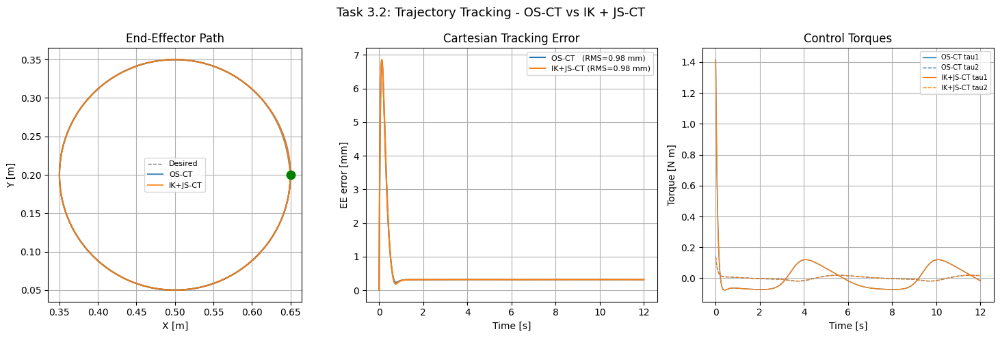

In [ ]:
# -----------------------------------------------------------------------
# Task 3.2: Trajectory Tracking
#   Method A: Operational-Space Computed Torque
#   Method B: IK + Joint-Space Computed Torque
# -----------------------------------------------------------------------

# ---- Desired circular trajectory --------------------------------------
center  = np.array([0.5, 0.2])
radius  = 0.15
omega_c = 2 * np.pi / 6.0   # one circle per 6 s

def desired_trajectory(t):
    """Desired circular position, velocity, and acceleration."""
    x_d   = center + radius * np.array([ np.cos(omega_c*t),  np.sin(omega_c*t)])
    xd_d  = radius * omega_c * np.array([-np.sin(omega_c*t),  np.cos(omega_c*t)])
    xdd_d = radius * omega_c**2 * np.array([-np.cos(omega_c*t), -np.sin(omega_c*t)])
    return x_d, xd_d, xdd_d

# ---- Controller A: Operational-Space CT --------------------------------
def ct_op_torque(model, data, x_d, xd_d, xdd_d, Kp, Kd):
    """
    Operational-space CT:
      tau = M(q) J^{-1}(xdd_d + Kd*ex_d + Kp*ex - Jdot*qdot) + bias
    Controls Cartesian error directly without IK.
    """
    q, qd = data.qpos.copy(), data.qvel.copy()
    J    = jacobian_2r(q, l1, l2)
    ex   = x_d  - fk_2r(q, l1, l2)
    exd  = xd_d - J @ qd
    Jdqd = jdot_qdot_2r(q, qd, l1, l2)
    M    = get_mass_matrix(model, data)
    bias = data.qfrc_bias.copy()
    v    = xdd_d + Kd * exd + Kp * ex - Jdqd
    return M @ np.linalg.solve(J, v) + bias

# ---- Controller B: IK + Joint-Space CT ---------------------------------
def ct_ik_joint_torque(model, data, x_d, xd_d, xdd_d, Kp, Kd):
    """
    IK + Joint-Space CT (extends ct_joint_torque from Task 3.1):
      Step 1 - Convert Cartesian trajectory to joint trajectory via IK:
        q_d   = IK(x_d)                         (desired joint angles)
        qd_d  = J(q_d)^{-1} * xd_d              (desired joint velocities)
        qdd_d = J(q_d)^{-1} * (xdd_d - Jdot*qd_d) (desired joint accelerations)
      Step 2 - Apply joint-space CT with feedforward:
        tau = M(q)(qdd_d + Kd*(qd_d - qdot) + Kp*(q_d - q)) + bias
    """
    q, qd = data.qpos.copy(), data.qvel.copy()

    # Step 1: Cartesian -> joint trajectory
    q_d  = ik_2r(x_d[0], x_d[1], l1, l2, elbow_up=True)
    J_d  = jacobian_2r(q_d, l1, l2)
    qd_d = np.linalg.solve(J_d, xd_d) # desired joint velocities via IK, this is obtained by inverting the Jacobian
    Jdqd = jdot_qdot_2r(q_d, qd_d, l1, l2)
    qdd_d = np.linalg.solve(J_d, xdd_d - Jdqd) # desired joint accelerations via IK

    # Step 2: Joint-space CT (same structure as ct_joint_torque in Task 3.1,
    #         extended with feedforward acceleration qdd_d)
    e  = q_d  - q
    ed = qd_d - qd
    M    = get_mass_matrix(model, data)
    bias = data.qfrc_bias.copy()
    return M @ (qdd_d + Kd * ed + Kp * e) + bias

# ---- Shared gains and initial condition --------------------------------
# Both controllers use the same wn=8, zeta=1.0 for a fair comparison
wn_t   = 8.0
zeta_t = 1.0
Kp_t   = wn_t**2             # 64
Kd_t   = 2 * zeta_t * wn_t  # 16

x0_traj, _, _ = desired_trajectory(0.0)
q0_traj = ik_2r(x0_traj[0], x0_traj[1], l1, l2, elbow_up=True)
T_traj  = 12.0   # two full circles
dt      = model.opt.timestep
n_steps = int(T_traj / dt)

# ---- Simulation helper ------------------------------------------------
def run_tracking(ctrl_fn):
    mujoco.mj_resetData(model, data)
    data.qpos[:] = q0_traj
    data.qvel[:] = [0.0, 0.0]
    mujoco.mj_forward(model, data)
    t_l  = np.zeros(n_steps)
    ee_l = np.zeros((n_steps, 2))
    xd_l = np.zeros((n_steps, 2))
    xe_l = np.zeros((n_steps, 2))
    tau_l = np.zeros((n_steps, 2))
    q_l  = np.zeros((n_steps, 2))
    for k in range(n_steps):
        t_now = data.time
        x_d, xd_d, xdd_d = desired_trajectory(t_now)
        tau = ctrl_fn(x_d, xd_d, xdd_d)
        data.ctrl[:] = tau
        mujoco.mj_step(model, data)
        t_l[k]   = data.time
        q_l[k]   = data.qpos.copy()
        ee_l[k]  = fk_2r(data.qpos, l1, l2)
        xd_l[k]  = x_d
        xe_l[k]  = x_d - fk_2r(data.qpos, l1, l2)
        tau_l[k] = tau
    return t_l, q_l, ee_l, xd_l, xe_l, tau_l

print('Running OS-CT simulation...')
t_os, q_os, ee_os, xd_os, xe_os, tau_os = run_tracking(
    lambda x_d, xd_d, xdd_d: ct_op_torque(model, data, x_d, xd_d, xdd_d, Kp_t, Kd_t))

print('Running IK + JS-CT simulation...')
t_ik, q_ik, ee_ik, xd_ik, xe_ik, tau_ik = run_tracking(
    lambda x_d, xd_d, xdd_d: ct_ik_joint_torque(model, data, x_d, xd_d, xdd_d, Kp_t, Kd_t))

rms_os = np.sqrt(np.mean(xe_os**2, axis=0)) * 1000
rms_ik = np.sqrt(np.mean(xe_ik**2, axis=0)) * 1000
print(f'RMS error -- OS-CT:    ex={rms_os[0]:.3f} mm, ey={rms_os[1]:.3f} mm')
print(f'RMS error -- IK+JS-CT: ex={rms_ik[0]:.3f} mm, ey={rms_ik[1]:.3f} mm')

# ---- Comparison plots -------------------------------------------------
theta_c  = np.linspace(0, 2*np.pi, 300)
circle_x = center[0] + radius * np.cos(theta_c)
circle_y = center[1] + radius * np.sin(theta_c)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
fig.suptitle('Task 3.2: Trajectory Tracking - OS-CT vs IK + JS-CT', fontsize=13)

ax = axes[0]
ax.set_aspect('equal')
ax.plot(circle_x, circle_y, 'k--', lw=1, alpha=0.5, label='Desired')
ax.plot(ee_os[:, 0], ee_os[:, 1], 'C0-', lw=1.5, alpha=0.8, label='OS-CT')
ax.plot(ee_ik[:, 0], ee_ik[:, 1], 'C1-', lw=1.5, alpha=0.8, label='IK+JS-CT')
ax.plot(ee_os[0, 0], ee_os[0, 1], 'go', ms=9)
ax.set_xlabel('X [m]'); ax.set_ylabel('Y [m]')
ax.set_title('End-Effector Path'); ax.legend(fontsize=8); ax.grid(True)

ax = axes[1]
err_os = np.linalg.norm(xe_os, axis=1) * 1000
err_ik = np.linalg.norm(xe_ik, axis=1) * 1000
ax.plot(t_os, err_os, 'C0', label=f'OS-CT   (RMS={np.sqrt(np.mean(err_os**2)):.2f} mm)')
ax.plot(t_ik, err_ik, 'C1', label=f'IK+JS-CT (RMS={np.sqrt(np.mean(err_ik**2)):.2f} mm)')
ax.set_xlabel('Time [s]'); ax.set_ylabel('EE error [mm]')
ax.set_title('Cartesian Tracking Error'); ax.legend(fontsize=8); ax.grid(True)

ax = axes[2]
ax.plot(t_os, tau_os[:, 0], 'C0-',  lw=1,   label='OS-CT tau1')
ax.plot(t_os, tau_os[:, 1], 'C0--', lw=1,   label='OS-CT tau2')
ax.plot(t_ik, tau_ik[:, 0], 'C1-',  lw=1,   label='IK+JS-CT tau1')
ax.plot(t_ik, tau_ik[:, 1], 'C1--', lw=1,   label='IK+JS-CT tau2')
ax.set_xlabel('Time [s]'); ax.set_ylabel('Torque [N m]')
ax.set_title('Control Torques'); ax.legend(fontsize=7); ax.grid(True)

plt.tight_layout()
display(fig)
plt.close(fig)

# ---- Side-by-side animation -------------------------------------------
from matplotlib.animation import FuncAnimation

stride = max(1, n_steps // 300)
q_os_s  = q_os[::stride];  ee_os_s = ee_os[::stride];  xd_s = xd_os[::stride]
q_ik_s  = q_ik[::stride];  ee_ik_s = ee_ik[::stride]
n_fr    = len(q_os_s)

fig_a, (axL, axR) = plt.subplots(1, 2, figsize=(12, 6))
fig_a.suptitle('Task 3.2: OS-CT (left) vs IK + JS-CT (right)', fontsize=12)
R2 = l1 + l2 + 0.1

for ax, title in zip([axL, axR],
                     ['Operational-Space CT', 'IK + Joint-Space CT']):
    ax.set_xlim(-R2, R2); ax.set_ylim(-R2, R2)
    ax.set_aspect('equal'); ax.grid(True); ax.set_title(title)
    ax.plot(circle_x, circle_y, 'k--', lw=1, alpha=0.3)

arm_os,   = axL.plot([], [], 'o-', lw=3, color='C0', ms=6)
trace_os, = axL.plot([], [], '-',  lw=1.5, color='C0', alpha=0.5)
des_os,   = axL.plot([], [], 'r*', ms=10, zorder=5)
arm_ik,   = axR.plot([], [], 'o-', lw=3, color='C1', ms=6)
trace_ik, = axR.plot([], [], '-',  lw=1.5, color='C1', alpha=0.5)
des_ik,   = axR.plot([], [], 'r*', ms=10, zorder=5)

def _arm(q):
    elbow = np.array([l1*np.cos(q[0]), l1*np.sin(q[0])])
    ee    = fk_2r(q, l1, l2)
    return [0, elbow[0], ee[0]], [0, elbow[1], ee[1]]

def _init_a():
    for ln in [arm_os, trace_os, des_os, arm_ik, trace_ik, des_ik]:
        ln.set_data([], [])
    return arm_os, trace_os, des_os, arm_ik, trace_ik, des_ik

def _update_a(i):
    xs, ys = _arm(q_os_s[i])
    arm_os.set_data(xs, ys)
    trace_os.set_data(ee_os_s[:i+1, 0], ee_os_s[:i+1, 1])
    des_os.set_data([xd_s[i, 0]], [xd_s[i, 1]])
    xs, ys = _arm(q_ik_s[i])
    arm_ik.set_data(xs, ys)
    trace_ik.set_data(ee_ik_s[:i+1, 0], ee_ik_s[:i+1, 1])
    des_ik.set_data([xd_s[i, 0]], [xd_s[i, 1]])
    return arm_os, trace_os, des_os, arm_ik, trace_ik, des_ik

ani_a = FuncAnimation(fig_a, _update_a, frames=n_fr,
                      init_func=_init_a, interval=20, blit=True)
plt.close(fig_a)
display(HTML(ani_a.to_jshtml()))

## Task 4: Control for UR5 Robot Using Mujoco

This task is optional. In Tasks 1-3 we applied computed torque control to a single-joint arm and a 2R planar robot, in both joint space and operational (Cartesian) space. Here we extend that framework to the **UR5**, a 6-DOF manipulator.

In [1]:
!pip install mujoco

# Set up GPU rendering.
from google.colab import files
import distutils.util
import os
import subprocess
if subprocess.run('nvidia-smi').returncode:
  raise RuntimeError(
      'Cannot communicate with GPU. '
      'Make sure you are using a GPU Colab runtime. '
      'Go to the Runtime menu and select Choose runtime type.')

# Add an ICD config so that glvnd can pick up the Nvidia EGL driver.
# This is usually installed as part of an Nvidia driver package, but the Colab
# kernel doesn't install its driver via APT, and as a result the ICD is missing.
# (https://github.com/NVIDIA/libglvnd/blob/master/src/EGL/icd_enumeration.md)
NVIDIA_ICD_CONFIG_PATH = '/usr/share/glvnd/egl_vendor.d/10_nvidia.json'
if not os.path.exists(NVIDIA_ICD_CONFIG_PATH):
  with open(NVIDIA_ICD_CONFIG_PATH, 'w') as f:
    f.write("""{
    "file_format_version" : "1.0.0",
    "ICD" : {
        "library_path" : "libEGL_nvidia.so.0"
    }
}
""")

# Configure MuJoCo to use the EGL rendering backend (requires GPU)
print('Setting environment variable to use GPU rendering:')
%env MUJOCO_GL=egl

#this line needs to be after
import mujoco

# Check if installation was succesful.
try:
  print('Checking that the installation succeeded:')
  import mujoco
  mujoco.MjModel.from_xml_string('<mujoco/>')
except Exception as e:
  raise e from RuntimeError(
      'Something went wrong during installation. Check the shell output above '
      'for more information.\n'
      'If using a hosted Colab runtime, make sure you enable GPU acceleration '
      'by going to the Runtime menu and selecting "Choose runtime type".')

print('Installation successful.')

# Other imports and helper functions
import time
import itertools
import numpy as np

# Graphics and plotting.
print('Installing mediapy:')
!command -v ffmpeg >/dev/null || (apt update && apt install -y ffmpeg)
!pip install -q mediapy
import mediapy as media
import matplotlib.pyplot as plt

# More legible printing from numpy.
np.set_printoptions(precision=3, suppress=True, linewidth=100)

from IPython.display import clear_output
clear_output()

After setting up Mujoco, we can download the zip folder contains the Mujoco file for the UR5e robot on Canvas.
Then you follow the steps belwo to upload to Colab.

- Open your Colab notebook

- In the left sidebar, click the folder icon to open the Files panel

- Click the upload icon (page with up-arrow) and upload the zip file `universal_robots_ur5e.zip`

Archive:  universal_robots_ur5e.zip
  inflating: universal_robots_ur5e/assets/base_0.obj  
  inflating: universal_robots_ur5e/assets/base_1.obj  
  inflating: universal_robots_ur5e/assets/forearm_0.obj  
  inflating: universal_robots_ur5e/assets/forearm_1.obj  
  inflating: universal_robots_ur5e/assets/forearm_2.obj  
  inflating: universal_robots_ur5e/assets/forearm_3.obj  
  inflating: universal_robots_ur5e/assets/shoulder_0.obj  
  inflating: universal_robots_ur5e/assets/shoulder_1.obj  
  inflating: universal_robots_ur5e/assets/shoulder_2.obj  
  inflating: universal_robots_ur5e/assets/upperarm_0.obj  
  inflating: universal_robots_ur5e/assets/upperarm_1.obj  
  inflating: universal_robots_ur5e/assets/upperarm_2.obj  
  inflating: universal_robots_ur5e/assets/upperarm_3.obj  
  inflating: universal_robots_ur5e/assets/wrist1_0.obj  
  inflating: universal_robots_ur5e/assets/wrist1_1.obj  
  inflating: universal_robots_ur5e/assets/wrist1_2.obj  
  inflating: universal_robots_ur5e/ass

""

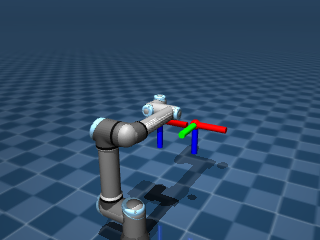

In [2]:
# the location of the XML file
!unzip -o universal_robots_ur5e.zip

# the location of the XML file
xml_path = "universal_robots_ur5e/scene.xml"

model = mujoco.MjModel.from_xml_path(xml_path)
data = mujoco.MjData(model)

# Reset the simulation to the initial keyframe.
mujoco.mj_resetDataKeyframe(model, data, 0)

# Initialize the renderer
renderer = mujoco.Renderer(model)

scene_option = mujoco.MjvOption()
scene_option.frame = mujoco.mjtFrame.mjFRAME_SITE
# Make all sitegroup visible
scene_option.sitegroup[:] = 1
scene_option.geomgroup[:] = 1

mujoco.mj_forward(model, data)


# Target_id
mocap_id = model.body("target").mocapid[0]
# End-effector site we wish to control, in this case a site attached to the last
# link (wrist_3_link) of the robot.
site_id = model.site("attachment_site").id

# Explicit free camera focused on end-effector
view_camera = mujoco.MjvCamera()
view_camera.type = mujoco.mjtCamera.mjCAMERA_FREE
view_camera.distance = 1.8
view_camera.azimuth = 120.0
view_camera.elevation = -20.0

def render_scene():
    view_camera.lookat[:] = data.site(site_id).xpos
    renderer.update_scene(data, camera=view_camera, scene_option=scene_option)
    return renderer.render()

media.show_image(render_scene())

### Define target trajectory

In [ ]:
center = np.array([-0.1, 0.5, 0.6])
radius = 0.1
f      = 0.25

# Examples:
#normal = np.array([0, 0, 1])   # horizontal circle (original XY plane)
#normal = np.array([1, 0, 0])   # vertical circle facing X
#normal = np.array([0, 1, 0])   # vertical circle facing Y
normal = np.array([1, 1, 1])   # tilted 45 degrees

def circle_3d(t, center, radius, normal, f):
    """
    Return 3D position on a circle.
      center : (3,) center point [m]
      radius : float
      normal : (3,) unit vector perpendicular to the circle plane
      f      : frequency [Hz]
    """
    # Build two orthogonal unit vectors in the circle plane
    normal = normal / np.linalg.norm(normal)

    # Pick an arbitrary vector not parallel to normal
    ref = np.array([0, 0, 1]) if abs(normal[2]) < 0.9 else np.array([1, 0, 0])
    u = np.cross(normal, ref);  u /= np.linalg.norm(u)   # first basis vector
    v = np.cross(normal, u)                               # second basis vector

    angle = 2 * np.pi * f * t
    return center + radius * (np.cos(angle) * u + np.sin(angle) * v)

### Visualization helper

In [ ]:
def add_visual_capsule(scene, point1, point2, radius, rgba):
    """Adds one capsule to an mjvScene."""
    if not hasattr(mujoco, "mjv_connector"):
        return
    if scene.ngeom >= scene.maxgeom:
        return
    scene.ngeom += 1  # increment ngeom
    # initialise a new capsule, then connect the two points
    mujoco.mjv_initGeom(scene.geoms[scene.ngeom-1],
                        mujoco.mjtGeom.mjGEOM_CAPSULE, np.zeros(3),
                        np.zeros(3), np.zeros(9), rgba.astype(np.float32))
    mujoco.mjv_connector(scene.geoms[scene.ngeom-1],
                         mujoco.mjtGeom.mjGEOM_CAPSULE, radius,
                         np.asarray(point1, dtype=np.float64),
                         np.asarray(point2, dtype=np.float64))

def modify_scene(scn, target_traj, end_effector_traj):
    """Draw position trace."""
    if len(target_traj) > 1:
        for i in range(len(target_traj)-1):
            add_visual_capsule(scn, target_traj[i], target_traj[i+1], 0.005, np.array([0, 0, 1.0, 1.0]))
            add_visual_capsule(scn, end_effector_traj[i], end_effector_traj[i+1], 0.005, np.array([1.0, 0, 0, 0.8]))

### Controller for the UR5

Previous tasks commanded joint positions through the MuJoCo XML and let the simulator's built-in PD controller track them. This task commands **joint torques directly**, computing them from a desired Cartesian acceleration -- the same principle as Task 3.2.


#### Controller Formulation

Given a target pose $\mathbf{x}_\text{target}$, we define the **Cartesian error** (actual minus desired, consistent with Task 3.2 sign convention):

$$\mathbf{e} = \mathbf{x} - \mathbf{x}_\text{target}$$

and the desired Cartesian acceleration as a PD feedback law:

$$\ddot{\mathbf{x}}_\text{des} = -K_p\,\mathbf{e} - K_d\,\dot{\mathbf{e}}$$

The torque command is:

$$\boldsymbol{\tau} = \mathbf{J}^\top \mathbf{M}_x\,\ddot{\mathbf{x}}_\text{des} + \mathbf{h}(\mathbf{q},\dot{\mathbf{q}})$$

where $\mathbf{h} = $ `data.qfrc_bias` contains Coriolis and gravity forces, and $\mathbf{M}_x = (\mathbf{J}\mathbf{M}^{-1}\mathbf{J}^\top)^{-1}$ is the **task-space inertia matrix**.

#### Relation to Task 3.2

In Task 3.2 the operational-space CT law was:

$$\boldsymbol{\tau} = \mathbf{M}(\mathbf{q})\,\mathbf{J}^{-1}\!\left(\ddot{\mathbf{x}}_\text{des} - \dot{\mathbf{J}}\dot{\mathbf{q}}\right) + \mathbf{h}(\mathbf{q},\dot{\mathbf{q}})$$

This required $\mathbf{J}^{-1}$, which only exists when the number of joints equals the task degrees of freedom (2 joints, 2D task for the planar robot). For the UR5 the Jacobian is $6 \times 6$ (6 joints, 6D pose), so $\mathbf{J}^{-1}$ exists but a more numerically robust alternative is to use $\mathbf{J}^\top\mathbf{M}_x$. When $\mathbf{J}$ is square and invertible these two are identical:

$$\mathbf{J}^\top\mathbf{M}_x = \mathbf{J}^\top(\mathbf{J}\mathbf{M}^{-1}\mathbf{J}^\top)^{-1} = \mathbf{M}\mathbf{J}^{-1}$$

The additional simplification here is that the $\dot{\mathbf{J}}\dot{\mathbf{q}}$ centripetal term is dropped -- a common approximation that works well at low speeds.


""

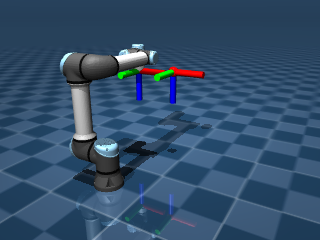

In [ ]:
# Delete previous renderer to avoid visualization conflict
try:
    del renderer
except:
    pass

# Load the UR5e model
model = mujoco.MjModel.from_xml_path(
    "C:\\Users\\jguoz\\mujoco_menagerie\\universal_robots_ur5e\\scene.xml")
data = mujoco.MjData(model)

# Reset to the default keyframe
mujoco.mj_resetDataKeyframe(model, data, 0)

renderer = mujoco.Renderer(model)
scene_option = mujoco.MjvOption()
scene_option.frame = mujoco.mjtFrame.mjFRAME_SITE
scene_option.sitegroup[4] = 1

mujoco.mj_forward(model, data)
renderer.update_scene(data, scene_option=scene_option)
media.show_image(renderer.render())

# mocap body drives the target marker; site is the controlled end-effector frame
mocap_id = model.body("target").mocapid[0]
site_id   = model.site("attachment_site").id


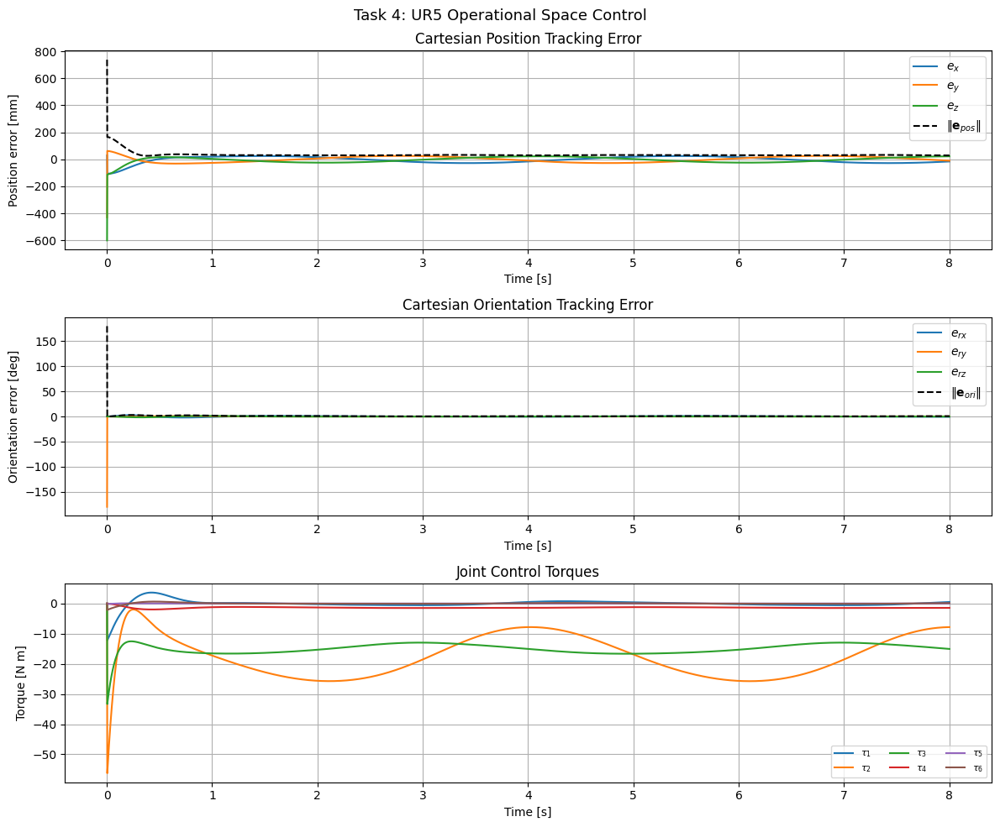

RMS position error:    39.11 mm
RMS orientation error: 2.996 deg


In [ ]:
import matplotlib.pyplot as plt

frames = []
target_traj       = []
end_effector_traj = []
duration  = 8
framerate = 30

# Pre-allocate arrays (nv = number of velocity DOFs = 6 for UR5e)
nv    = model.nv
M_inv = np.zeros((nv, nv))          # M(q)^{-1}: joint-space inertia inverse
J     = np.zeros((6, nv))           # Jacobian J(q): maps qdot -> xdot (6D pose)
e     = np.zeros(6)                 # Cartesian error e = x - x_target
e_pos = e[:3]                       # positional part of e
e_ori = e[3:]                       # orientational part of e
site_quat        = np.zeros(4)
target_quat_conj = np.zeros(4)
error_quat       = np.zeros(4)

# ---- Controller gains (same design approach as Task 3.2) ---------------
# Kp sets natural frequency: wn = sqrt(Kp)
# Kd set by critical damping: Kd = 2*sqrt(Kp)
Kp = np.concatenate([np.full(3, 100.0),   # position [N/m]
                     np.full(3,  50.0)])   # orientation [Nm/rad]
Kd = np.concatenate([2*np.sqrt(np.full(3, 100.0)),
                     2*np.sqrt(np.full(3,  50.0))])

# ---- Logging buffers --------------------------------------------------
t_log    = []
epos_log = []   # position error  [m]
eori_log = []   # orientation error [rad]
tau_log  = []   # joint torques   [N m]

mujoco.mj_resetDataKeyframe(model, data, 0)
while data.time < duration:

    # ---- Move the target along the circle ----------------------------
    data.mocap_pos[mocap_id] = circle_3d(data.time, center, radius, normal, f)

    # ---- Cartesian error e = x - x_target ---------------------------
    e_pos[:] = data.site(site_id).xpos - data.mocap_pos[mocap_id]

    # Orientation error via quaternion difference
    mujoco.mju_negQuat(target_quat_conj, data.mocap_quat[mocap_id])
    mujoco.mju_mat2Quat(site_quat, data.site(site_id).xmat)
    mujoco.mju_mulQuat(error_quat, site_quat, target_quat_conj)
    mujoco.mju_quat2Vel(e_ori, error_quat, 1.0)

    # ---- Jacobian J(q) via MuJoCo -----------------------------------
    mujoco.mj_jacSite(model, data, J[:3], J[3:], site_id)

    # ---- Task-space inertia M_x = (J M^{-1} J^T)^{-1} --------------
    mujoco.mj_solveM(model, data, M_inv, np.eye(nv))
    M_x_inv = J @ M_inv @ J.T
    M_x     = np.linalg.pinv(M_x_inv)

    # ---- Desired Cartesian acceleration (PD, no J_dot*q_dot term) ---
    xdd_des = -Kp * e - Kd * (J @ data.qvel)

    # ---- Torque: tau = J^T M_x xdd_des + h(q, q_dot) ---------------
    tau = J.T @ M_x @ xdd_des + data.qfrc_bias

    # ---- output torque--------------------------------------------
    #np.clip(tau, *model.actuator_ctrlrange.T, out=tau)
    #data.ctrl = tau

    # Invert servo dynamics to get position command that produces desired torque
    gains = model.actuator_gainprm[:, 0]   # [2000, 2000, 2000, 500, 500, 500]
    ctrl  = data.qpos + 0.2 * data.qvel + tau / gains # Compute position command from desired torque
    np.clip(ctrl, *model.actuator_ctrlrange.T, out=ctrl) # Clip control commands to actuator limits
    data.ctrl = ctrl

    # Step the simulation
    mujoco.mj_step(model, data)

    # ---- Log --------------------------------------------------------
    t_log.append(data.time)
    epos_log.append(e_pos.copy())
    eori_log.append(e_ori.copy())
    tau_log.append(tau.copy())

    target_traj.append(data.mocap_pos[mocap_id].copy())
    end_effector_traj.append(data.site(site_id).xpos.copy())

    if len(frames) < data.time * framerate:
        renderer.update_scene(data, scene_option=scene_option)
        modify_scene(renderer.scene, target_traj[::10], end_effector_traj[::10])
        frames.append(renderer.render())

media.show_video(frames, fps=framerate)

# ---- Convert logs to arrays ------------------------------------------
t_arr    = np.array(t_log)
epos_arr = np.array(epos_log)   # (N, 3)  x, y, z position error
eori_arr = np.array(eori_log)   # (N, 3)  rx, ry, rz orientation error
tau_arr  = np.array(tau_log)    # (N, 6)  joint torques

# ---- Plots -----------------------------------------------------------
fig, axes = plt.subplots(3, 1, figsize=(12, 10))
fig.suptitle('Task 4: UR5 Operational Space Control', fontsize=13)

# Position tracking error
ax = axes[0]
for j, label in enumerate(['x', 'y', 'z']):
    ax.plot(t_arr, epos_arr[:, j] * 1000, label=f'$e_{label}$')
ax.plot(t_arr, np.linalg.norm(epos_arr, axis=1) * 1000,
        'k--', lw=1.5, label='$\\|\\mathbf{e}_{pos}\\|$')
ax.set_xlabel('Time [s]'); ax.set_ylabel('Position error [mm]')
ax.set_title('Cartesian Position Tracking Error'); ax.legend(); ax.grid(True)

# Orientation tracking error
ax = axes[1]
for j, label in enumerate(['rx', 'ry', 'rz']):
    ax.plot(t_arr, np.degrees(eori_arr[:, j]), label=f'$e_{{{label}}}$')
ax.plot(t_arr, np.degrees(np.linalg.norm(eori_arr, axis=1)),
        'k--', lw=1.5, label='$\\|\\mathbf{e}_{ori}\\|$')
ax.set_xlabel('Time [s]'); ax.set_ylabel('Orientation error [deg]')
ax.set_title('Cartesian Orientation Tracking Error'); ax.legend(); ax.grid(True)

# Joint torques
ax = axes[2]
for j in range(nv):
    ax.plot(t_arr, tau_arr[:, j], label=f'$\\tau_{j+1}$')
ax.set_xlabel('Time [s]'); ax.set_ylabel('Torque [N m]')
ax.set_title('Joint Control Torques'); ax.legend(ncol=3, fontsize=8); ax.grid(True)

plt.tight_layout()
display(fig)
plt.close(fig)

rms_pos = np.sqrt(np.mean(np.sum(epos_arr**2, axis=1))) * 1000
rms_ori = np.degrees(np.sqrt(np.mean(np.sum(eori_arr**2, axis=1))))
print(f'RMS position error:    {rms_pos:.2f} mm')
print(f'RMS orientation error: {rms_ori:.3f} deg')

## Problems

We will control the 3R spatial robot shown below. The robot has three revolute joints.

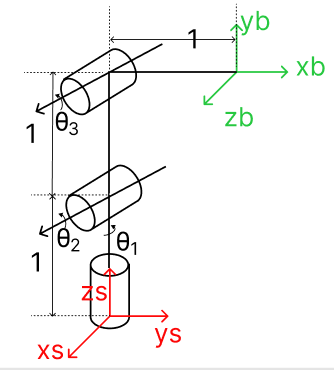

Each link has length $l = 1$ m. The workspace is a 3D region (roughly a hemisphere of radius 3 m).

We first create and load the MuJoCo model, then implement two tasks:
- **Problem 1:** Reach a random target point using PD control and Computed Torque Control
- **Problem 2:** Track a 3D circular trajectory using Computed Torque Control (position only)


In [ ]:
# -----------------------------------------------------------------------
# 3R Spatial Robot: MuJoCo XML and model loading
# -----------------------------------------------------------------------
# Robot structure (all links length = 1 m, mass = 1 kg):
#   Joint 1: pan  (Z-axis)  at base
#   Joint 2: pitch (Y-axis) at top of link 1
#   Joint 3: pitch (Y-axis) at top of link 2
#   End-effector: tip of link 3 (horizontal)

import mujoco, numpy as np, matplotlib.pyplot as plt, matplotlib
from IPython.display import HTML, display
matplotlib.use('Agg')

l1, l2, l3 = 1.0, 1.0, 1.0
m1, m2, m3 = 1.0, 1.0, 0.5

xml_3r = f"""
<mujoco model='3r_spatial'>
  <option gravity='0 0 -9.81' timestep='0.002' integrator='RK4'/>
  <compiler balanceinertia='true'/>
  <default>
    <joint damping='0' frictionloss='0'/>
    <motor ctrllimited='false'/>
  </default>

  <worldbody>
    <!-- Link 1: rotates about Z (pan), extends upward -->
    <body name='link1' pos='0 0 0'>
      <joint name='joint1' type='hinge' axis='0 0 1'/>
      <inertial pos='0 0 {l1/2}' mass='{m1}'
                diaginertia='{m1*l1**2/12:.4f} {m1*l1**2/12:.4f} 0.001'/>
      <geom type='capsule' fromto='0 0 0  0 0 {l1}' size='0.05' rgba='0.2 0.6 0.9 1' mass='0'/>

      <!-- Link 2: rotates about Y (pitch), extends upward -->
      <body name='link2' pos='0 0 {l1}'>
        <joint name='joint2' type='hinge' axis='0 1 0'/>
        <inertial pos='0 0 {l2/2}' mass='{m2}'
                  diaginertia='{m2*l2**2/12:.4f} {m2*l2**2/12:.4f} 0.001'/>
        <geom type='capsule' fromto='0 0 0  0 0 {l2}' size='0.04' rgba='0.9 0.5 0.2 1' mass='0'/>

        <!-- Link 3: rotates about Y (pitch), extends horizontally -->
        <body name='link3' pos='0 0 {l2}'>
          <joint name='joint3' type='hinge' axis='0 1 0'/>
          <inertial pos='{l3/2} 0 0' mass='{m3}'
                    diaginertia='0.001 {m3*l3**2/12:.4f} {m3*l3**2/12:.4f}'/>
          <geom type='capsule' fromto='0 0 0  {l3} 0 0' size='0.03' rgba='0.3 0.8 0.3 1' mass='0'/>
          <site name='end_effector' pos='{l3} 0 0' size='0.04' rgba='1 0 0 1'/>
        </body>
      </body>
    </body>
  </worldbody>

  <actuator>
    <motor name='tau1' joint='joint1'/>
    <motor name='tau2' joint='joint2'/>
    <motor name='tau3' joint='joint3'/>
  </actuator>
</mujoco>"""

with open('3r_spatial.xml', 'w') as f:
    f.write(xml_3r)

model   = mujoco.MjModel.from_xml_path('3r_spatial.xml')
data    = mujoco.MjData(model)
site_id = model.site('end_effector').id
print(f'Model loaded: {model.nv} DOF, timestep={model.opt.timestep} s')

# ---- Shared helper functions (reused in both problems) ----------------

def get_mass_matrix(model, data):
    """Joint-space inertia matrix M(q), shape (3,3)."""
    M = np.zeros((model.nv, model.nv))
    mujoco.mj_fullM(model, M, data.qM)
    return M

def get_ee_pos(data, site_id):
    """End-effector 3D position via MuJoCo forward kinematics."""
    return data.site(site_id).xpos.copy()

def get_jacobian(model, data, site_id):
    """Translational Jacobian J(q), shape (3,3): maps qdot -> ee velocity."""
    J_pos = np.zeros((3, model.nv))
    J_rot = np.zeros((3, model.nv))
    mujoco.mj_jacSite(model, data, J_pos, J_rot, site_id)
    return J_pos   # shape (3,3) for 3-DOF robot


### Problem 1: Reaching Task

**Goal:** Drive the end-effector to a random reachable target position $\mathbf{x}^* \in \mathbb{R}^3$ from an arbitrary initial configuration.

**Steps:**
1. Sample a random target inside the reachable workspace
2. Compute the desired joint angles $\mathbf{q}_d$ (use MuJoCo or fix $q_1=0$ and solve analytically for $q_2, q_3$)
3. Implement a **joint-space PD controller**: $\boldsymbol{\tau} = K_p(\mathbf{q}_d - \mathbf{q}) + K_d(\mathbf{0} - \dot{\mathbf{q}})$
4. Implement a **joint-space computed torque controller**: $\boldsymbol{\tau} = \mathbf{M}(\mathbf{q})(K_p\mathbf{e} + K_d\dot{\mathbf{e}}) + \mathbf{h}(\mathbf{q},\dot{\mathbf{q}})$
5. Run both simulations from the same initial condition and compare

**Hint:** For gain design, use the same approach as Task 3.1: choose $\omega_n$ and $\zeta$, then $K_p = \omega_n^2$, $K_d = 2\zeta\omega_n$.


In [ ]:
# -----------------------------------------------------------------------
# Problem 1: Reaching Task -- scaffold code
# -----------------------------------------------------------------------

# ---- TODO: Implement the PD controller --------------------------------
def pd_torque(data, q_d, Kp, Kd):
    """
    Joint-space PD controller (set-point, qdot_d = 0).
      tau = Kp*(q_d - q) + Kd*(0 - qdot)
    """
    # TODO: implement
    pass

# ---- TODO: Implement the Computed Torque controller ------------------
def ct_joint_torque(model, data, q_d, Kp, Kd):
    """
    Joint-space computed torque controller (set-point).
      tau = M(q)*(Kp*(q_d - q) + Kd*(0 - qdot)) + h(q, qdot)
    Hint: use get_mass_matrix() and data.qfrc_bias
    """
    # TODO: implement
    pass

# ---- Controller gains -------------------------------------------------
wn, zeta = 10.0, 0.9
Kp_ct = wn**2           # for CT
Kd_ct = 2*zeta*wn
Kp_pd = 400             # for PD: higher gains needed (no inertia cancellation)
Kd_pd = 50

# ---- Random reachable target ------------------------------------------
rng   = np.random.default_rng(seed=0)
# Workspace: sphere of radius (l1+l2+l3), avoid singularity near origin
r_tgt = rng.uniform(0.5, l1+l2+l3 - 0.1)
az    = rng.uniform(0, 2*np.pi)        # azimuth (joint 1 direction)
el    = rng.uniform(0, np.pi/2)        # elevation (above ground)
target_pos = r_tgt * np.array([np.sin(el)*np.cos(az),
                               np.sin(el)*np.sin(az),
                               np.cos(el)])
print(f'Target: {target_pos}')

# ---- TODO: Compute desired joint angles q_d via inverse kinematics ----
# Hint: fix q1 = arctan2(target_pos[1], target_pos[0]) for the pan angle,
# then the problem reduces to a 2R planar IK in the vertical plane.
# q1 = ?
# q2 = ?  (use 2R IK with the planar distance and height)
# q3 = ?
q_des = np.zeros(3)   # TODO: replace with IK solution

# ---- Simulation -------------------------------------------------------
q0    = np.array([0.0, np.pi/6, -np.pi/4])   # initial configuration
T_sim = 5.0
dt    = model.opt.timestep
n_steps = int(T_sim / dt)

def run_sim_p1(ctrl_fn):
    mujoco.mj_resetData(model, data)
    data.qpos[:] = q0;  data.qvel[:] = 0
    mujoco.mj_forward(model, data)
    t_l  = np.zeros(n_steps)
    q_l  = np.zeros((n_steps, 3))
    ee_l = np.zeros((n_steps, 3))
    tau_l = np.zeros((n_steps, 3))
    for k in range(n_steps):
        tau = ctrl_fn()
        data.ctrl[:] = tau
        mujoco.mj_step(model, data)
        t_l[k] = data.time
        q_l[k] = data.qpos.copy()
        ee_l[k] = get_ee_pos(data, site_id)
        tau_l[k] = tau
    return t_l, q_l, ee_l, tau_l

t_pd,  q_pd,  ee_pd,  tau_pd  = run_sim_p1(lambda: pd_torque(data, q_des, Kp_pd, Kd_pd))
t_ct,  q_ct,  ee_ct,  tau_ct  = run_sim_p1(lambda: ct_joint_torque(model, data, q_des, Kp_ct, Kd_ct))

# ---- Plot results (fill in) ------------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
fig.suptitle('Problem 1: Reaching Task - PD vs CT', fontsize=12)

# TODO: plot joint angle errors, EE distance to target, control torques
# Hint: np.linalg.norm(ee_pd - target_pos, axis=1) gives EE distance over time

plt.tight_layout()
display(fig); plt.close(fig)


### Problem 2: Trajectory Tracking (Position Only)

**Goal:** Track a 3D circular trajectory $\mathbf{x}_d(t)$ using computed torque control in **operational space** (position only, no orientation control).

Since the 3R robot has 3 joints and the task is 3D position (3 DOF), the translational Jacobian $\mathbf{J}_{pos} \in \mathbb{R}^{3\times3}$ is square and invertible (away from singularities). The operational-space CT law is:

$$\boldsymbol{\tau} = \mathbf{M}(\mathbf{q})\,\mathbf{J}_{pos}^{-1}\left(\ddot{\mathbf{x}}_d + K_d\,\dot{\mathbf{e}} + K_p\,\mathbf{e} - \dot{\mathbf{J}}_{pos}\dot{\mathbf{q}}\right) + \mathbf{h}(\mathbf{q},\dot{\mathbf{q}})$$

where $\mathbf{e} = \mathbf{x}_d - \mathbf{x}$ is the 3D Cartesian position error.

**Steps:**
1. Define a 3D circle using the `circle_3d` function (choose center, radius, normal vector)
2. Implement the operational-space CT controller
3. Compare with the IK + joint-space CT approach (Method B from Task 3.2):
   compute $\mathbf{q}_d$, $\dot{\mathbf{q}}_d$, $\ddot{\mathbf{q}}_d$ from the trajectory at each step, then apply joint-space CT

**Hint:** Use `np.linalg.solve(J, v)` instead of `np.linalg.inv(J) @ v` for numerical stability. The $\dot{\mathbf{J}}\dot{\mathbf{q}}$ term can be approximated numerically or dropped as a simplification.


In [ ]:
# -----------------------------------------------------------------------
# Problem 2: Trajectory Tracking -- scaffold code
# -----------------------------------------------------------------------

# ---- 3D circle trajectory --------------------------------------------
def circle_3d(t, center, radius, normal, f):
    """3D circular trajectory: position, velocity, acceleration."""
    normal = normal / np.linalg.norm(normal)
    ref = np.array([0,0,1]) if abs(normal[2]) < 0.9 else np.array([1,0,0])
    u = np.cross(normal, ref);  u /= np.linalg.norm(u)
    v = np.cross(normal, u)
    w   = 2 * np.pi * f
    x_d   = center + radius * (np.cos(w*t)*u + np.sin(w*t)*v)
    xd_d  = radius * w  * (-np.sin(w*t)*u + np.cos(w*t)*v)
    xdd_d = radius * w**2 * (-np.cos(w*t)*u - np.sin(w*t)*v)
    return x_d, xd_d, xdd_d

# Trajectory parameters -- choose center inside the reachable workspace
traj_center = np.array([1.0, 0.0, 1.5])   # adjust as needed
traj_radius = 0.3
traj_normal = np.array([0, 0, 1])          # horizontal circle; try [1,0,0] or [1,1,0]
traj_f      = 0.2                           # Hz

# ---- TODO: Implement Method A -- Operational-Space CT ----------------
def ct_op_torque(model, data, x_d, xd_d, xdd_d, Kp, Kd):
    """
    Operational-space CT (position only):
      tau = M(q) J^{-1}(xdd_d + Kd*(xd_d - J*qdot) + Kp*(x_d - x) - Jdot*qdot) + h
    Note: Jdot*qdot can be set to zero as a simplification.
    Hint: use get_mass_matrix(), get_jacobian(), get_ee_pos(), data.qfrc_bias,
          and np.linalg.solve(J, v) to avoid explicit matrix inversion.
    """
    # TODO: implement
    pass

# ---- TODO: Implement Method B -- IK + Joint-Space CT -----------------
def ct_ik_joint_torque(model, data, x_d, xd_d, xdd_d, Kp, Kd):
    """
    IK + Joint-Space CT:
      Step 1: q_d   = IK(x_d)                        (desired joint angles)
              qd_d  = J^{-1} * xd_d                  (desired joint velocities)
              qdd_d = J^{-1} * (xdd_d - Jdot*qdot)   (desired joint accelerations)
      Step 2: tau = M(q)*(qdd_d + Kd*(qd_d-qdot) + Kp*(q_d-q)) + h
    Hint: for IK, fix q1 from the target azimuth angle, then apply 2R IK
          in the vertical plane for q2 and q3.
    """
    # TODO: implement
    pass

# ---- Controller gains (same for both methods) -------------------------
wn_t, zeta_t = 8.0, 1.0
Kp_t = wn_t**2
Kd_t = 2 * zeta_t * wn_t

# ---- Compute initial joint angles (start on the circle) --------------
x0, _, _ = circle_3d(0.0, traj_center, traj_radius, traj_normal, traj_f)
# TODO: compute q0_traj = IK(x0) so the robot starts on the trajectory
q0_traj = np.array([0.0, 0.5, -0.3])   # placeholder -- replace with IK

# ---- Simulation -------------------------------------------------------
T_traj  = 1.0 / traj_f * 2   # two full circles
n_steps = int(T_traj / model.opt.timestep)

def run_sim_p2(ctrl_fn):
    mujoco.mj_resetData(model, data)
    data.qpos[:] = q0_traj;  data.qvel[:] = 0
    mujoco.mj_forward(model, data)
    t_l   = np.zeros(n_steps)
    ee_l  = np.zeros((n_steps, 3))
    xd_l  = np.zeros((n_steps, 3))
    xe_l  = np.zeros((n_steps, 3))
    tau_l = np.zeros((n_steps, 3))
    for k in range(n_steps):
        x_d, xd_d, xdd_d = circle_3d(data.time, traj_center, traj_radius,
                                      traj_normal, traj_f)
        tau = ctrl_fn(x_d, xd_d, xdd_d)
        data.ctrl[:] = tau
        mujoco.mj_step(model, data)
        t_l[k]   = data.time
        ee_l[k]  = get_ee_pos(data, site_id)
        xd_l[k]  = x_d
        xe_l[k]  = x_d - get_ee_pos(data, site_id)
        tau_l[k] = tau
    return t_l, ee_l, xd_l, xe_l, tau_l

t_os,  ee_os,  xd_os,  xe_os,  tau_os  = run_sim_p2(
    lambda x_d, xd_d, xdd_d: ct_op_torque(model, data, x_d, xd_d, xdd_d, Kp_t, Kd_t))
t_ik,  ee_ik,  xd_ik,  xe_ik,  tau_ik  = run_sim_p2(
    lambda x_d, xd_d, xdd_d: ct_ik_joint_torque(model, data, x_d, xd_d, xdd_d, Kp_t, Kd_t))

# ---- Plot results (fill in) ------------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
fig.suptitle('Problem 2: Trajectory Tracking - OS-CT vs IK+JS-CT', fontsize=12)

# TODO: plot (1) EE path vs desired circle (3D or XY projection)
#            (2) Cartesian tracking error norm over time
#            (3) Control torques
# Hint: np.linalg.norm(xe_os, axis=1)*1000 gives error magnitude in mm

plt.tight_layout()
display(fig); plt.close(fig)

rms_os = np.sqrt(np.mean(np.sum(xe_os**2, axis=1))) * 1000
rms_ik = np.sqrt(np.mean(np.sum(xe_ik**2, axis=1))) * 1000
print(f'RMS error -- OS-CT:    {rms_os:.2f} mm')
print(f'RMS error -- IK+JS-CT: {rms_ik:.2f} mm')